In [19]:
import os
import subprocess
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
#%matplotlib inline
from scipy.stats import norm
from scipy.optimize import minimize, curve_fit
from scipy import special
import uproot
import tqdm
import time
from IPython.display import display
import seaborn as sns
colors = sns.color_palette('colorblind')

# optional: use LaTex style for matplotlib
mpl.style.use("/Users/svan/Software/paper.mplstyle")
# mpl.style.use("/Users/pinguino/paper.mplstyle")

# pGRAMS Readout Analysis Notebook

Plotting and analysis tools for the pGRAMS readout chain. After loading in decoded ADC data (currently via sshfs remote mount), the following plots and outputs can be produced:

- **Waveform Plots** (input data: any run)
  - Plot waveform for a specific channel and a specific event
  - Plot waveforms of all channels for a specific event
  - Plot event-averaged waveform for a specific channel
- **ADC Calibration** (input data: single channel runs with injected pulses of varying height)
  - Plot ADC peak amplitude vs. input charge
  - Plot ADC peak ampl. vs. input charge with linear fit
  - Return resolution, dynamic range, saturation point
- **Noise Plots** (input data: baseline runs)
  - Baseline ADC counts histogram for a specific channel
  - Noise RMS for a given set of channels
- **Crosstalk** (input data: single channel runs with injected pulse)
  - Correlation for a specific active channel (correlation vs. channel number)
  - Correlation Matrix
 
Feel free to reach out to Svanik (st3624@columbia.edu) or Ibrahim (isafa@nevis.columbia.edu) with any questions!

## Import and Unpack Data

Currently, test data is located at **/home/ub/WinDriver/wizard/GRAMS_project_am** on the ub@sbndelec01.nevis.columbia.edu server. This notebook accesses this data by remote mounting the ub server's GRAMS directory onto your local machine. This requires sshfs to be installed on your machine:
- Ubuntu systems: run `sudo apt install sshfs` in terminal
- Mac: https://osxfuse.github.io/
- Windows: https://github.com/winfsp/sshfs-win

Once installed, run the following cell in order to make a mount point in your home directory named remote_mount.

In [20]:
GRAMSdir = os.path.expanduser("~/remote_mount")
os.makedirs(GRAMSdir, exist_ok=True) # make a mount point in your home directory if it doesn't already exist

If you set up passwordless ssh to ub, then you can use the cell below to mount the GRAMS directory. Otherwise, you can mount it manually by running the following command in your terminal:

```sshfs ub@sbndelec01.nevis.columbia.edu:/home/ub/WinDriver/wizard/GRAMS_project_am ~/remote_mount```

When you are done with the remote mount, you can unmount the directory via: `umount ~/remote_mount`

In [21]:
# # if you have passwordless ssh to ub set up, you can use this cell to remote mount the GRAMS directory on local machine
# host = "ub"
# remote_path = "/home/ub/WinDriver/wizard/GRAMS_project_am "

# # mount and unmount commands
# mount = f"sshfs {host}:{remote_path} {GRAMSdir} -o kill_on_unmount,reconnect,allow_other,defer_permissions,IdentityFile=~/.ssh/id_rsa"
# unmount = f"umount {GRAMSdir}"

# try:
#     # make sure the directory is not currently mounted, then mount
#     subprocess.run(unmount, shell=True, check=True)
#     subprocess.run(mount, shell=True, check=True)
# except:
#     # otherwise just directly mount
#     subprocess.run(mount, shell=True, check=True)

As an alternative option, you may also copy data over to your local machine and set GRAMSdir manually in the cell below. There is some sample data in the git repo available for use.

In [22]:
# # set GRAMSdir manually:
# GRAMSdir = os.path.expanduser("~/Software/GRAMS/pGRAMS_code/pGRAMS-Readout-Integration")
# GRAMSdir = os.path.expanduser("./")

Every test's data should have a dedicated test directory within GRAMSdir. For each test directory, there is a corresponding .csv file in GRAMSdir providing details about the test conditions and individual runs. Set the test directory with `testdir`, and your desired location for saving plots with `savedir`.

In [23]:
# set desired test and save directories here:
testdir = "pGRAMS_readout/NEU_011625"
# testdir = "NEU_011625"
# testdir = "pGRAMS_readout/NEU_011725"
# testdir = "Dewar0_52124"
# testdir = "readout_test_51624"
# TPC0_52024: ADC only baseline
# TPC1_52024: Cryostat, no shaper
# TPC2_52024: Cryostat + shaper

savedir = os.path.expanduser("~/Downloads")

# load and preview CSV
csv = pd.read_csv(f"{GRAMSdir}/{testdir}.csv")
# csv = pd.read_csv(f"{GRAMSdir}/pGRAMS_readout/NEU_ChargeDynamicRange_011725.csv")
# csv = pd.read_csv(f"{savedir}/NEU_ChargeDynamicRange_011725.csv")
# csv = pd.read_csv(f"{savedir}/NEU_011625 2.csv")
display(csv.dropna(axis=1, how='all')) # display csv, omitting empty columns

OSError: [Errno 6] Device not configured: '/Users/svan/remote_mount/pGRAMS_readout/NEU_011625.csv'

Next we extract and loop through the filenames to load the corresponding ADC data into a dictionary of dataframes. If you are only interested in certain runs from a given test, you can hardcode the `filenames` variable.

In [13]:
filenames = csv['File ID'].tolist()
filenames = [100, 101, 102]
# filenames = [105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 119, 120]
# filenames = [180, 181, 182, 183, 184, 185, 186, 187, 188]
print(filenames)

if 'df_dict' not in locals():
    df_dict = {}
for filename in tqdm.tqdm(filenames, desc=f'extracting ADC data...', total=len(filenames)):
    if filename not in df_dict.keys():
        file = uproot.open(f"{GRAMSdir}/{testdir}/pGRAMS_decoded_{filename}.root")
        # file = uproot.open(f"{GRAMSdir}/{testdir}/outfile_{filename}.root")
        tree = file["adc_tree"]
        df_dict[filename]=tree.arrays(library="pd")

[100, 101, 102]


extracting ADC data...: 100%|██████████| 3/3 [01:33<00:00, 31.15s/it]


Finally, we define functions that parse through each run and identify indices where unique channel and event data start/end.

In [14]:
# takes in dataframe and returns indices marking where event and channel specific blocks start and end
def get_segments(df):
    # detect changes in event_id and channel_id
    event_changes = df['event_id'].diff().ne(0)
    channel_changes = df['channel_id'].diff().ne(0)
    change_points = event_changes | channel_changes
    #change_points = event_changes | channel_changes

    # find indices where changes occur
    change_indices = df.index[change_points].tolist()
    change_indices.append(len(df))

    segments = []
    start_idx = 1

    for end_idx in change_indices:
        event_id = df.iloc[start_idx]['event_id']
        channel_id = df.iloc[start_idx]['channel_id']
        segments.append((start_idx, end_idx, event_id, channel_id))
        start_idx = end_idx
        
    # print(segments)
    return segments

# parses through segments and returns a specific event and channel
def select_event_channel(df, segments, target_event_id, target_channel_id):
    for start, end, event_id, channel_id in segments:
        if event_id == target_event_id and channel_id == target_channel_id:
            # print(df.iloc[start:end])
            # print(start, end)
            return df.iloc[start:end]
    return pd.DataFrame()

# parses through segments and returns all channels for a specific event as a list of dataframes
def select_all_channels_for_event(df, segments, target_event_id):
    event_data_list = []
    for start, end, event_id, channel_id in segments:
        if event_id == target_event_id:
            event_data_list.append(df.iloc[start:end])
    return event_data_list

# parses through segments and returns all events for a specific channel as a list of dataframes
def select_all_events_for_channel(df, segments, target_channel_id):
    channel_data_list = []
    for start, end, event_id, channel_id in segments:
        if channel_id == target_channel_id:
            channel_data_list.append(df.iloc[start:end])
    return channel_data_list

change_inds = {i: get_segments(df_dict[i]) for i in df_dict}

## Waveform Plotter

The waveform plotter functions plot ADC counts vs. Time for any run of interest. The following three waveform plotter functions are available:
- **Specific Channel, Specific Event**: `plot_channel_event()` plots a single waveform for a specific channel and a specific event
- **All Channels, Specific Event**: `plot_all_channels_for_event()` plots waveforms of all channels for a specific event
- **Event-Averaged, Specific Channel**: `plot_average_for_channel()` plots an event-averaged waveform for a specific channel

### Specific Channel, Specific Event

In [15]:
# plots a single waveform for a specific channel and a specific event
def plot_channel_event(file_list, channel, event, disc=0, zoom=0, saveas=''):
    # set baseline (0.5*4096)
    baseline=2048

    for filename in file_list:
        inds = change_inds[filename]
        df = df_dict[filename]
        nsamps = inds[1][1]
        sum_counts = np.zeros(nsamps)
        sum_squares = np.zeros(nsamps)

        # create time axis (2 MHz sampling rate -> 0.5 us steps)
        time = 0.5*np.arange(nsamps)
        
        df_adc = select_event_channel(df, inds, event, channel)
        # print(df_adc)
        adc_counts = df_adc['adc_count']
        if(len(adc_counts)!=nsamps):
            print('Ch: {} Event: {} FEM: {} Found missing adc counts. {} instead of {}'.format(channel, event, len(adc_counts), nsamps))

        if disc!=0 and np.max(np.abs(adc_counts.values-baseline))<(disc):
            continue
        plt.figure(figsize=[9,6])
        plt.plot(time, adc_counts.values)
        plt.title(f'ADC Counts for Channel {channel}, Event {event}, Run {filename}')
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.xlim(time.min(), time.max())
        # plt.xlim(150, 180)
        if zoom!=0: plt.ylim(baseline-zoom, baseline+zoom)
        else: plt.ylim(0, 4096)
        plt.grid(True)
        if saveas: plt.savefig(f'{savedir}/ADCCounts_Ch{channel}Event{event}Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
    return

**`plot_channel_event()` takes the following inputs:**
- `file_list`: list of runs
- `channel`: channel number
- `event`: event number
- `disc`: discriminator threshold in ADC counts above or below baseline. set to 0 for no discriminator
- `zoom`: y-axis zoom. `zoom=100` means the y-axis will range from +/-100 ADC counts about the baseline. set to 0 for no zoom
- `saveas`: file extension to save plot ('pdf', 'png', 'jpg', etc.). plots will be saved to `savedir`. set as `save=''` for no saving

We can loop through all events using a discriminator threshold to quickly find all events with a pulse on a single channel:

In [16]:
def plot_channel_event_subplot(file_list, channel, event, disc=0, zoom=0, saveas=''):
    # set baseline (0.5*4096)
    baseline = 2048
    
    # Create the plot once, outside the loop
    plt.figure(figsize=[9,6])
    
    for filename in file_list:
        inds = change_inds[filename]
        df = df_dict[filename]
        nsamps = inds[1][1]
        
        # create time axis (2 MHz sampling rate -> 0.5 us steps)
        time = 0.5*np.arange(nsamps)
        
        df_adc = select_event_channel(df, inds, event, channel)
        adc_counts = df_adc['adc_count']
        
        if(len(adc_counts)!=nsamps):
            print('Ch: {} Event: {} FEM: {} Found missing adc counts. {} instead of {}'.format(
                channel, event, filename, len(adc_counts), nsamps))
            continue
            
        if disc!=0 and np.max(np.abs(adc_counts.values-baseline))<(disc):
            continue
            
        # Plot on the same figure, with label for each file
        plt.plot(time, adc_counts.values, label=f'Run {filename}')
    
    # Add plot decorations after all lines are plotted
    plt.title(f'ADC Counts for Channel {channel}, Event {event}')
    plt.xlabel('Time (us)')
    plt.ylabel('ADC Counts')
    plt.xlim(time.min(), time.max())
    if zoom!=0:
        plt.ylim(baseline-zoom, baseline+zoom)
    else:
        plt.ylim(0, 4096)
    plt.grid(True)
    plt.legend()  # Add legend to distinguish different runs
    
    if saveas:
        plt.savefig(f'{savedir}/ADCCounts_Ch{channel}Event{event}_AllRuns.{saveas}', 
                    dpi=400, bbox_inches='tight')
    
    return


On Event 2, channel 0


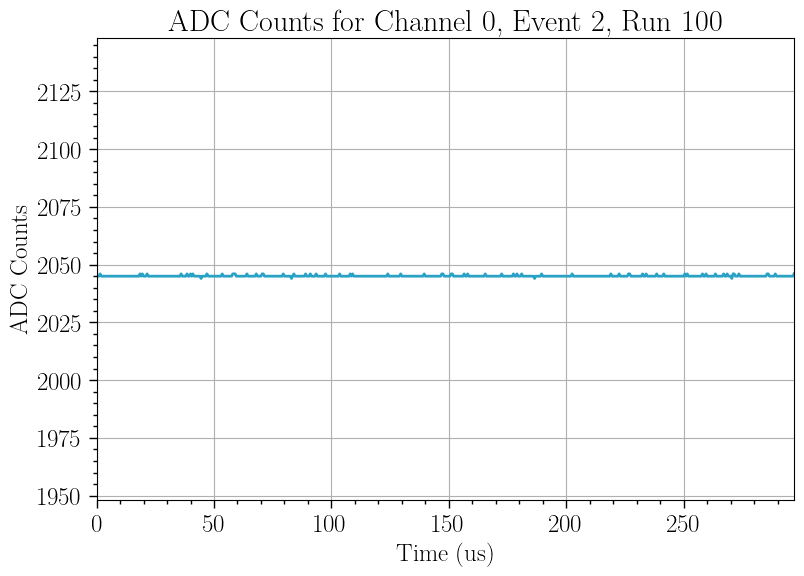

On Event 3, channel 0


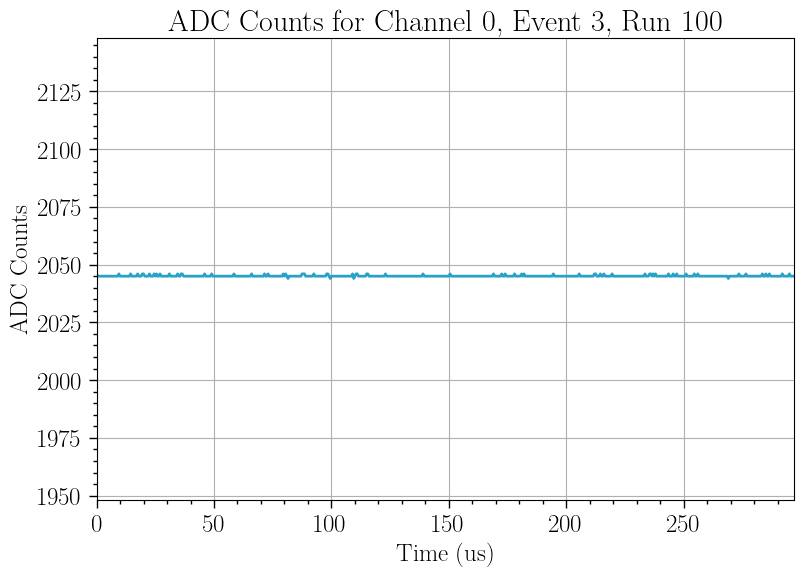

On Event 4, channel 0


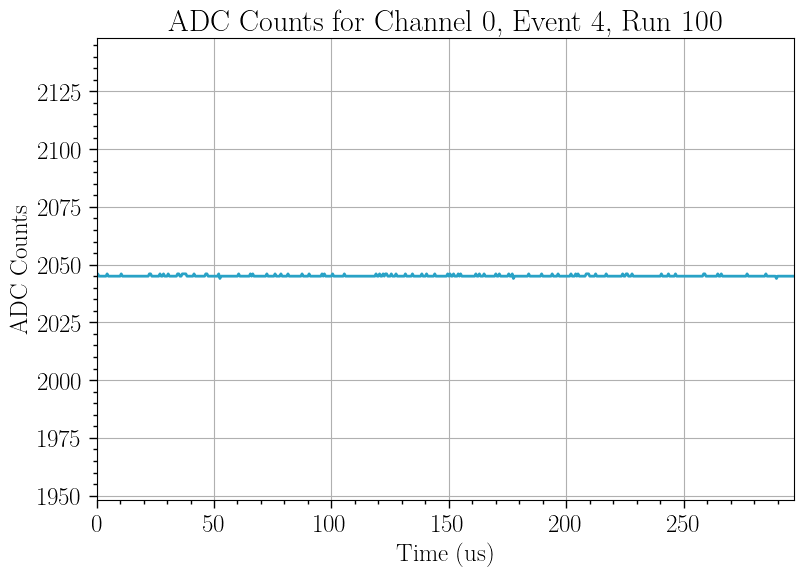

On Event 5, channel 0


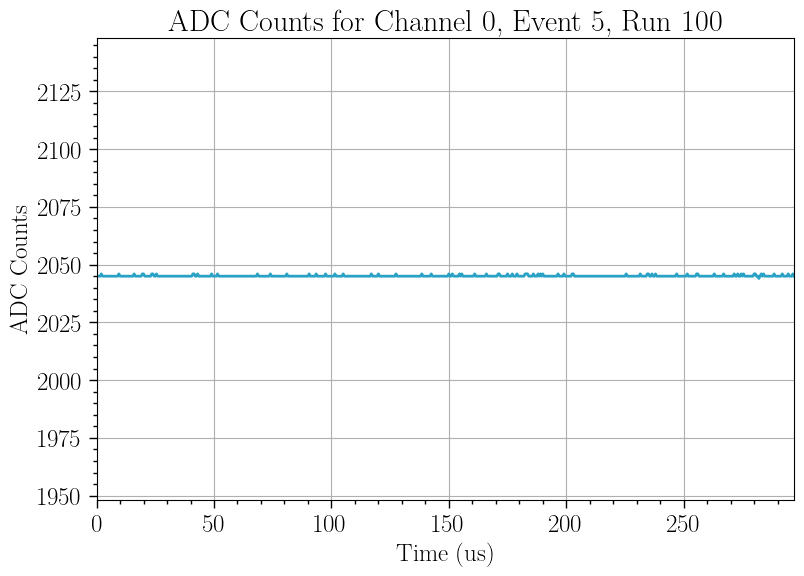

In [18]:
num_of_events = 6
chan = np.arange(0,1)
for i in range(2, num_of_events):
    for ch in chan:
        print(f'On Event {i}, channel {ch}')
        plot_channel_event(file_list=[100], channel=ch, event=i, disc=0, zoom=100, saveas='')

# chan = [0, 2, 3, 4, 7, 9, 10, 12, 14]
#chan = np.arange(0,15)
# for ch in chan:
#     for i in range(2, num_of_events):
#         plot_channel_event_subplot(file_list=[103], channel=ch, event=i, disc=0, zoom=50, saveas='')

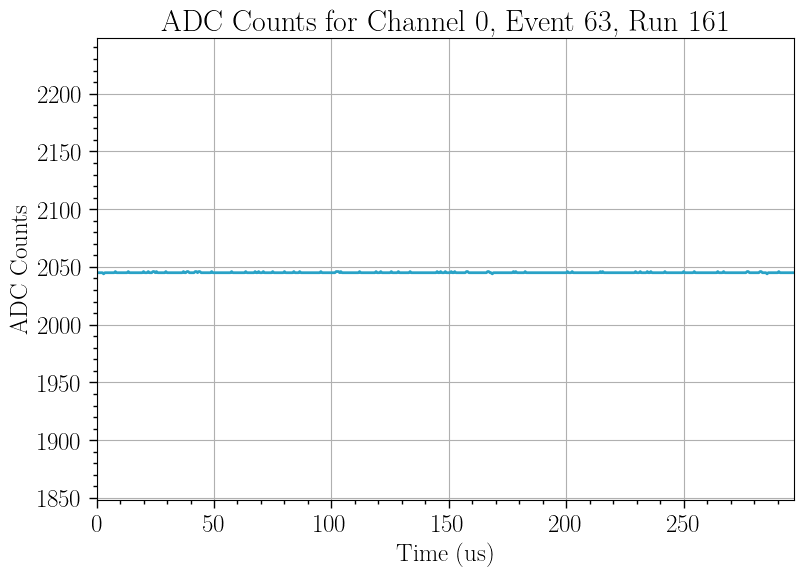

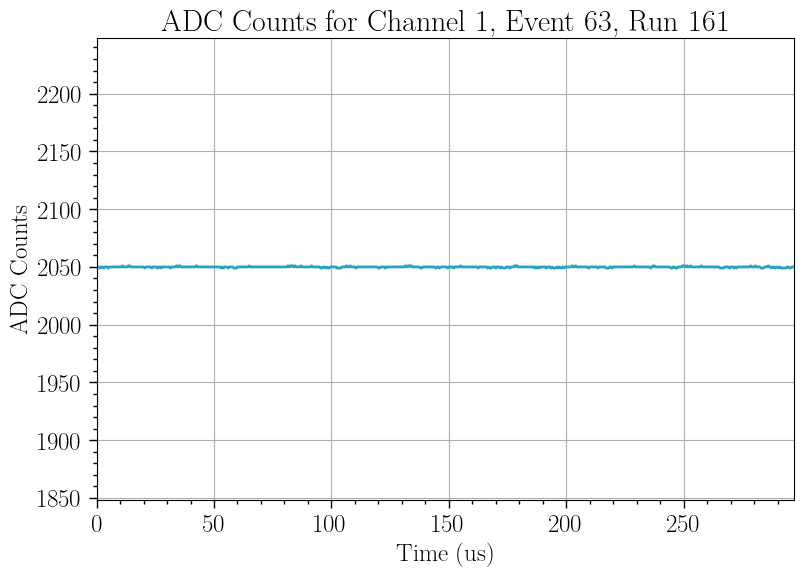

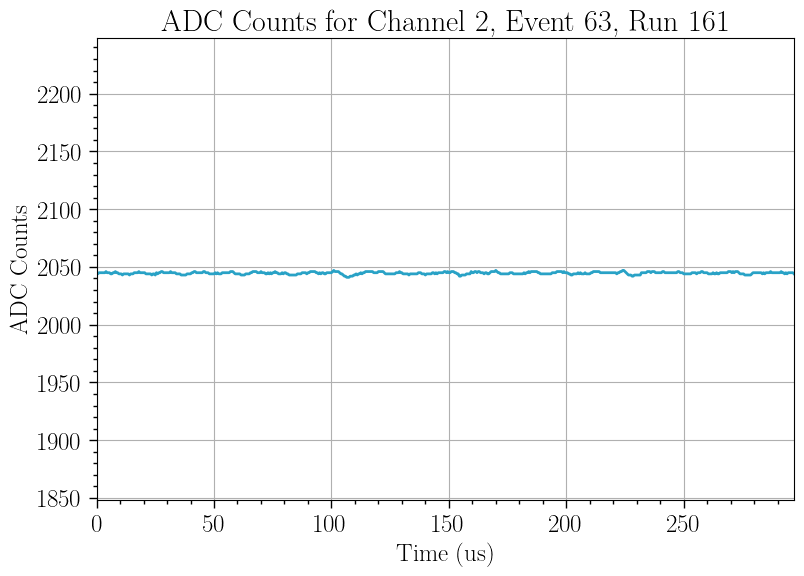

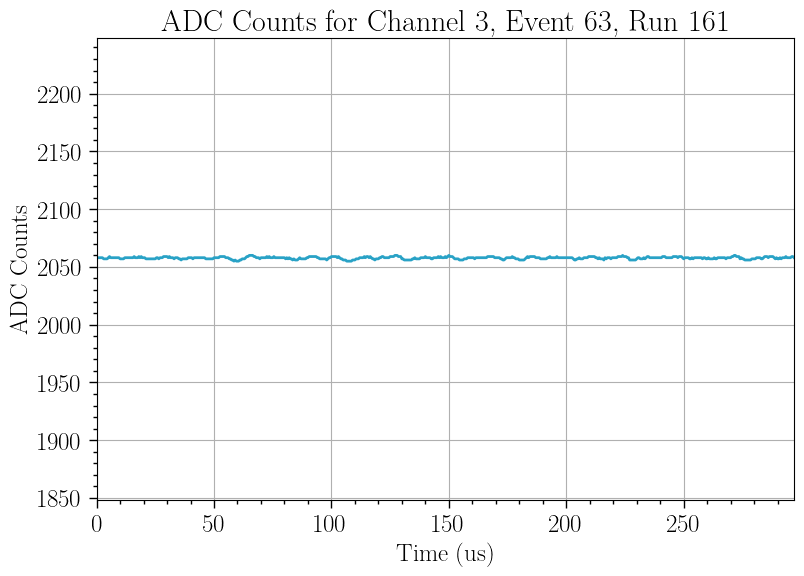

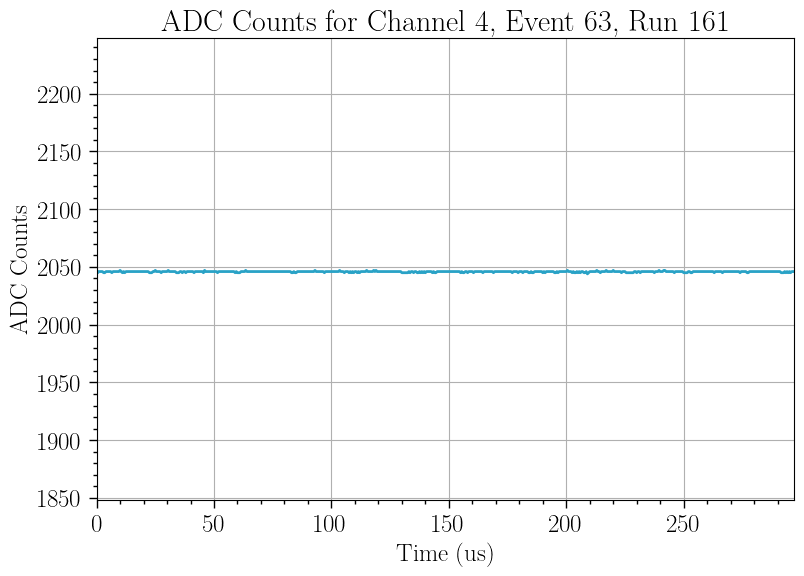

...

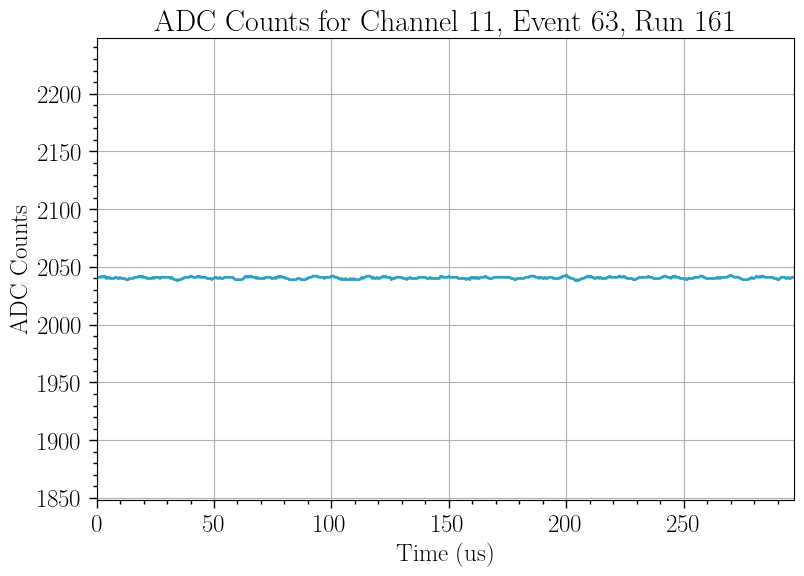

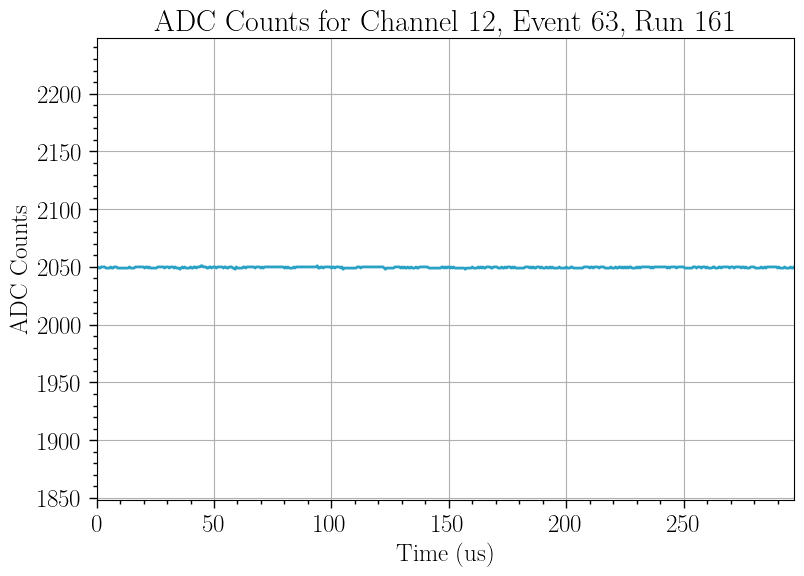

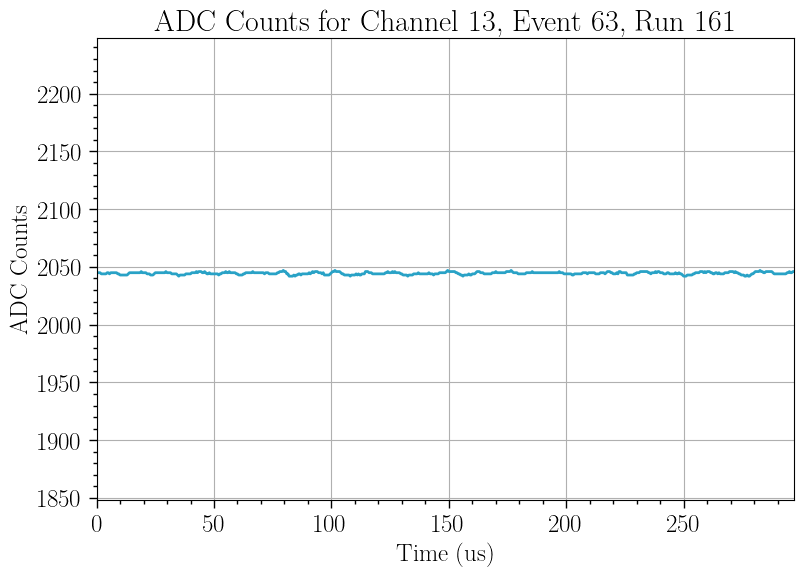

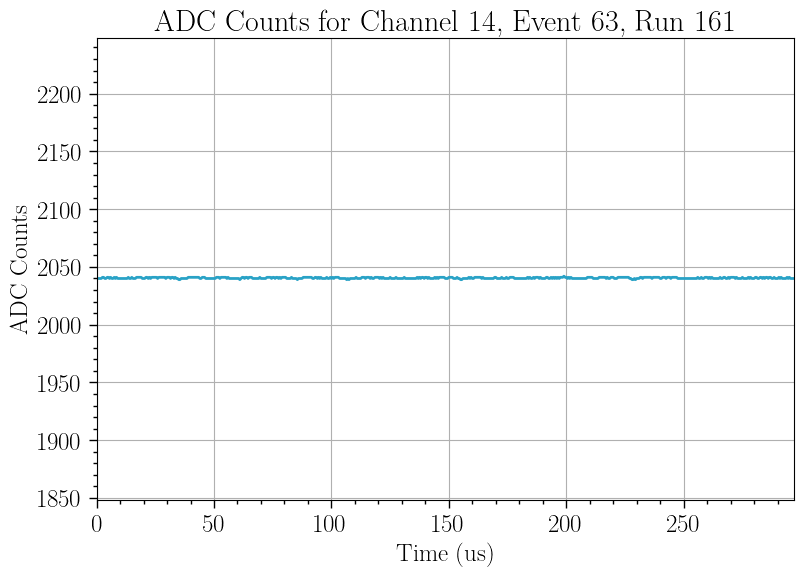

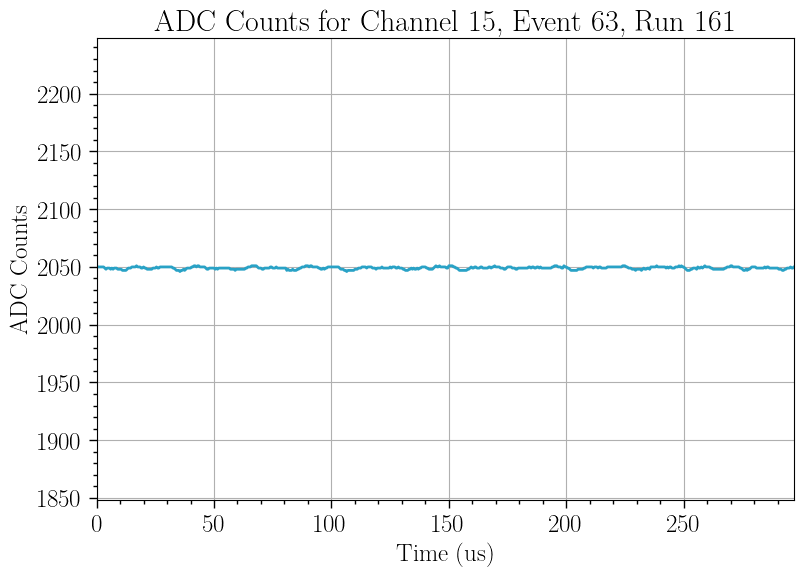

In [ ]:
chan = np.arange(0,16)
for ch in chan:
    plot_channel_event(file_list=[161], channel=ch, event=63, disc=0, zoom=200, saveas='')

Once we've found events of interest, we can single them out and save them if needed.

In [ ]:
plot_channel_event(file_list=[48], channel=8, event=7, disc=0, zoom=0, saveas='')

### All Channels, Specific Event

In [ ]:
# plots waveforms of all channels for a specific event
def plot_all_channels_for_event(file_list, event, disc=0, zoom=0, hide=False, saveas=''):
    # set baseline (0.5*4096)
    baseline=2048

    for filename in file_list:
        chs=[]
        inds = change_inds[filename]
        df = df_dict[filename]
        nsamps = inds[1][1]
        sum_counts = np.zeros(nsamps)
        sum_squares = np.zeros(nsamps)

        # create time axis (2 MHz sampling rate -> 0.5 us steps)
        time = 0.5*np.arange(nsamps)
        
        selected_samples = select_all_channels_for_event(df, inds, event)
        for i in range(len(selected_samples)-1):
            adc_counts = selected_samples[i+1]['adc_count']
            if(len(adc_counts)!=nsamps):
                print('Ch: {} Event: {} Found missing adc counts. {} instead of {}'.format(i+1, event, len(adc_counts), nsamps))
                continue
            # if discrimination is nonzero and counts are below threshold, skip plotting this event for all channels
            if disc!=0 and np.max(np.abs(adc_counts.values-baseline))<(disc):
                continue
            else:
                chs.append(i)
                
        # otherwise, if we are above threshold we want to plot all channels for this event
        if chs:
            plt.figure(figsize=[8,6])
            if hide and disc!=0: 
                [plt.plot(time, selected_samples[i+1]['adc_count'].values,  label=f'Ch. {i+1}') for i in chs]
                plt.legend(loc='best')
            else:[plt.plot(time, selected_samples[i+1]['adc_count'].values) for i in range(len(selected_samples)-1)]
            #plt.fill_between(time, average_counts - std_deviation, average_counts + std_deviation, color = colors[0], alpha=0.3, label='Std Dev')
            plt.title(f'ADC Counts for Event {event}, Run {filename}')
            plt.xlabel('Time (us)')
            plt.ylabel('ADC Counts')
            plt.xlim(time.min(), time.max())
            plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
            if zoom!=0: plt.ylim(baseline-zoom, baseline+zoom)
            else: plt.ylim(0, 4096)
            plt.grid(True)
            if saveas: plt.savefig(f'{savedir}/ADCCounts_Event{event}Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
            plt.show()    
            
    return

**`plot_all_channels_for_event()` takes the following inputs:**
- `file_list`: list of runs
- `event`: event number
- `disc`: discriminator threshold; set to 0 for no discriminator
- `zoom`:y-axis zoom. `zoom=100` means the y-axis will range from +/-100 ADC counts about the baseline. set to zero for no zoom
- `hide`: `hide=True` hides waveforms from channels below the discriminator threshold
- `saveas`: file extension to save plot ('pdf', 'png', 'jpg', etc.). plots will be saved to `savedir`. set `save=''` for no saving

We can loop through all events using a discriminator threshold to quickly find all events with a pulse on any channel:

In [ ]:
file_list = [21]
num_of_events = 963
for i in range(1, num_of_events):
    print("On Event {}".format(i))
    plot_all_channels_for_event(file_list, i, disc=20, zoom=200, hide=True)

On Event 1


KeyError: 21

Once we've found events of interest, we can single them out and save them if needed.

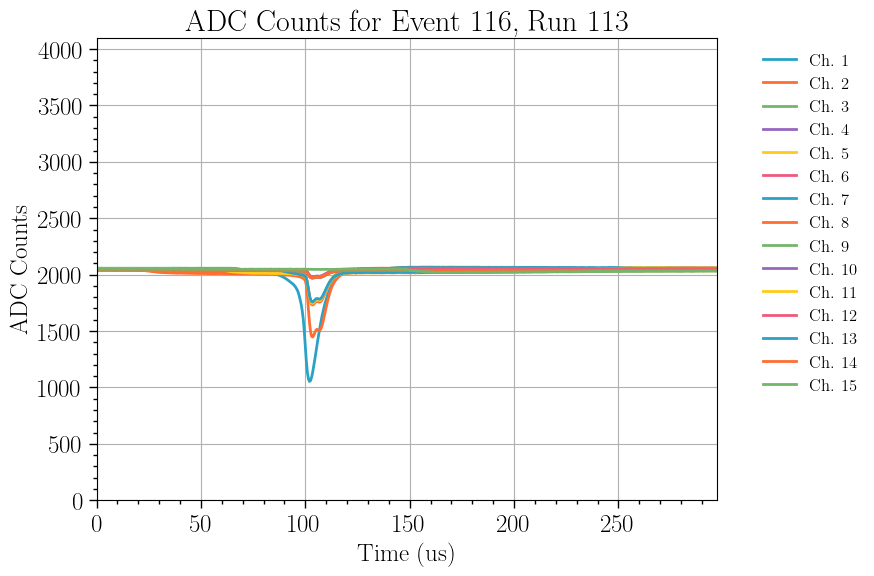

In [ ]:
plot_all_channels_for_event(file_list=[113], event=116, disc=20, zoom=0, hide=True, saveas='')

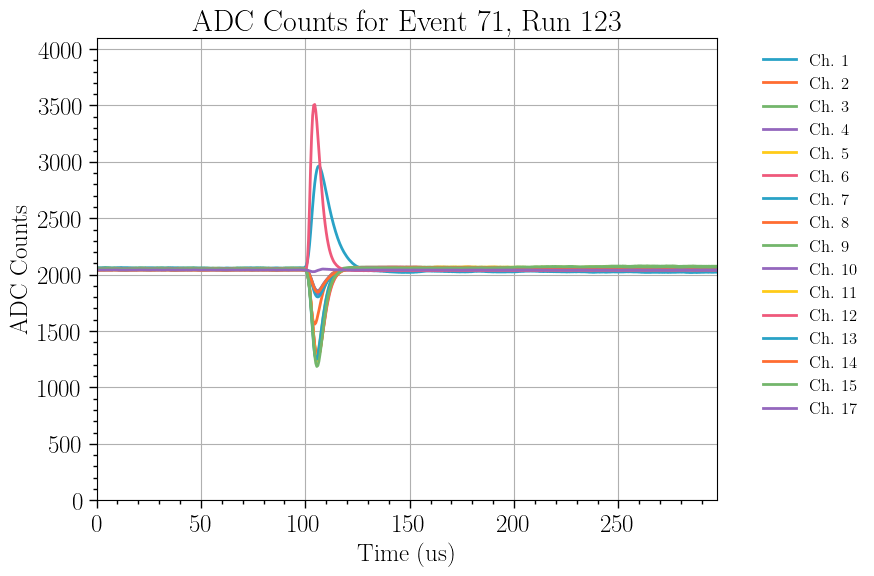

In [ ]:
plot_all_channels_for_event(file_list=[123], event=71, disc=20, zoom=0, hide=True, saveas='')

### Event-Averaged, Specific Channel

In [ ]:
def plot_average_for_channel(file_list, channel, zoom=0, saveas=''):
    # set baseline (0.5*4096)
    baseline=2048

    for filename in file_list:
        inds = change_inds[filename]
        df = df_dict[filename]
        nsamps = inds[1][1]
        sum_counts = np.zeros(nsamps)
        sum_squares = np.zeros(nsamps)

        # create time axis (2 MHz sampling rate -> 0.5 us steps)
        time = 0.5*np.arange(nsamps)
        selected_samples = select_all_events_for_channel(df, inds, channel)
        plt.figure(figsize=[8,6])
        
        for i in range(len(selected_samples)):
            adc_counts = selected_samples[i]['adc_count']
            if(len(adc_counts)!=nsamps):
                print('Ch: {} Event: {} Found missing adc counts. {} instead of {}'.format(i+1, event, len(adc_counts), nsamps))
            else:
                sum_counts  += adc_counts.values
                sum_squares += adc_counts.values ** 2
    
        average_counts = sum_counts / len(selected_samples)
        variance = (sum_squares / len(selected_samples)) - (average_counts ** 2)
        std_deviation = np.sqrt(variance)

        plt.plot(time, average_counts, label='Average')
        plt.fill_between(time, average_counts - std_deviation, average_counts + std_deviation, color = colors[0], alpha=0.3, label='Std Dev')
        plt.title(f'ADC Counts for Channel {channel}, Run {filename}')
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.xlim(time.min(), time.max())
        if zoom!=0: plt.ylim(baseline-zoom, baseline+zoom)
        else: plt.ylim(0, 4096)
        plt.legend(loc='best')
        plt.grid(True)
        if saveas: plt.savefig(f'{savedir}/AveragedADCCountsRun{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
        
    return

**`plot_average_for_channel()` takes the following inputs:**
- `file_list`: list of runs
- `channel`: channel number
- `zoom`: y-axis zoom. `zoom=100` means the y-axis will range from +/-100 ADC counts about the baseline. set to zero for no zoom
- `saveas`: file extension to save plot ('pdf', 'png', 'jpg', etc.). plots will be saved to `savedir`. set `save=''` for no saving

This function is only really useful if you are reading out an injected pulse with a consistent trigger.

In [ ]:
plot_average_for_channel(file_list=[303], channel=62, zoom=100, saveas='')

## ADC Calibration

The ADC calibration analysis expects a set of single-channel runs with injected pulses of varying amplitudes. The input amplitudes should be documented in the associated test .csv file. Given this data, the following functions are available:
- **ADC Peak Amplitude vs. Input Charge**: `plot_peaks_vs_Q()` plots peak ADC counts (event-averaged) versus input charge.
- **Linear Fit and ADC Characteristics**: `linearity()` plots peak ADC counts (event-averaged) versus input charge with the linear fit superimposed and returns a table with resolution, dynamic range, and saturation point in terms of charge units and voltage units.

The cell below defines `findpeaks()`, a helper function used by both `plot_peaks_vs_Q()` and `linearity()`.

In [11]:
# finds event-averaged peak ADC counts and corresponding input charge for each run
def findpeaks(channels):
    # initialize peaks and charge outputs
    baseline=2048
    peaks = dict()
    Q = dict()

    # loop through channels
    for ch in channels:
        # extract file_list and pulse heights for given channel
        mask_ch = csv[csv['ADC Ch.'].isin([ch])]
        files = mask_ch['File ID'].tolist()
        mV = mask_ch['Input (mVpp)'].tolist()

        # need to mask again to ensure we only use files that were loaded into df_dict
        file_mask = [file for file in files if file in filenames] 
        print(file_mask)
        mV_mask = [mv for file, mv in zip(mask_ch['File ID'], mask_ch['Input (mVpp)']) if file in filenames]

        
        # convert mV to charge
        Vdiv = (1/11) # preamp voltage divider
        Cin = 1 # preamp input capacitance, in pF
        Q[ch] = (np.array(mV_mask) * Vdiv * 10**-3) * (Cin * 10**-12) * 10**15 # charge in fC
        
        # intialize peaks output for specific channel
        peaks[ch] = []
        # loop through all runs for specific channel
        for filename in file_mask:
            df = df_dict[filename]

            # find FEM for run
            fem_id = csv.loc[csv['File ID'] == filename, 'FEM ID'].iloc[0]
            
            # slice dataframe for FEM and desired channel, find max height for each event
            mask = np.logical_and(df['fem_id'] == fem_id ,df['channel_id'] == ch)
            
            # find unique event IDs
            event_ids = np.unique(df['event_id'][mask])
            max_counts = []
            for event in event_ids:
                mask = df['event_id']==event
                max_counts = np.max(np.abs(df['adc_count'][mask] - baseline))+baseline
            peaks[ch].append(max_counts.mean())
            
    return peaks, Q

### ADC Peak Amplitude vs. Input Charge

In [12]:
def plot_peaks_vs_Q(channels, overlay=1, zoom=0, saveas=''):
    peaks, Q = findpeaks(channels)
    # if overlay is enabled, plot on the same figure
    if overlay:
        figure = plt.figure(figsize=[9,6])
        [plt.plot(Q[c], peaks[c], marker='x', linestyle='None', label=f'Ch.{c}') for c in channels]
        plt.title(f'ADC Amplitude vs. Input Charge')
        plt.xlabel('Input Charge (fC)', fontsize=20)
        plt.ylabel('Counts')
        if zoom!=0: plt.ylim(zoom[0], zoom[1])
        else: plt.ylim(plt.ylim()[0], 4150)
        plt.grid(True)
        plt.legend(loc='best')
        if saveas: plt.savefig(f'{savedir}/ADCAmpvsCharge.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
    else:
        for c in channels:
            plt.figure(figsize=[9,6])
            plt.plot(Q[c], peaks[c], marker='x', linestyle='None', label=f'Ch.{c}')
            plt.title(f'ADC Amplitude vs. Input Charge, Ch.{c}')
            plt.xlabel('Input Charge (fC)', fontsize=20)
            plt.ylabel('Counts')
            if zoom!=0: plt.ylim(zoom[0], zoom[1])
            else: plt.ylim(plt.ylim()[0], 4150)
            plt.grid(True)
            if saveas: plt.savefig(f'{savedir}/ADCAmpvsCharge_Ch{c}.{saveas}', dpi=400, bbox_inches='tight')
            plt.show()
    return

**`plot_peaks_vs_Q()` takes the following inputs:**
- `channels`: list of channels to plot
- `overlay`: by default `overlay=1` overlays individual channel plots. `overlay=0` will create separate plots
- `zoom`: y-axis zoom. `zoom=[2048, 2500]` sets the y-axis limits from 2048 to 2500 ADC counts. set `zoom=0` for default (minimum amplitude to 4150)
- `saveas`: file extension to save plot ('pdf', 'png', 'jpg', etc.). plots will be saved to `savedir`. set `save=''` for no saving

In [13]:
findpeaks(channels=[0])

[180, 181, 182, 183, 184, 185, 186, 187, 188]


({0: [2073.0, 2058.0, 2196.0, 2237.0, 2299.0, 2361.0, 2423.0, 2487.0, 2060.0]},
 {0: array([  4.27272727,  17.09090909,  29.90909091,  38.45454545,
          51.27272727,  64.09090909,  76.81818182,  89.63636364,
         102.45454545])})

[180, 181, 182, 183, 184, 185, 186, 187, 188]


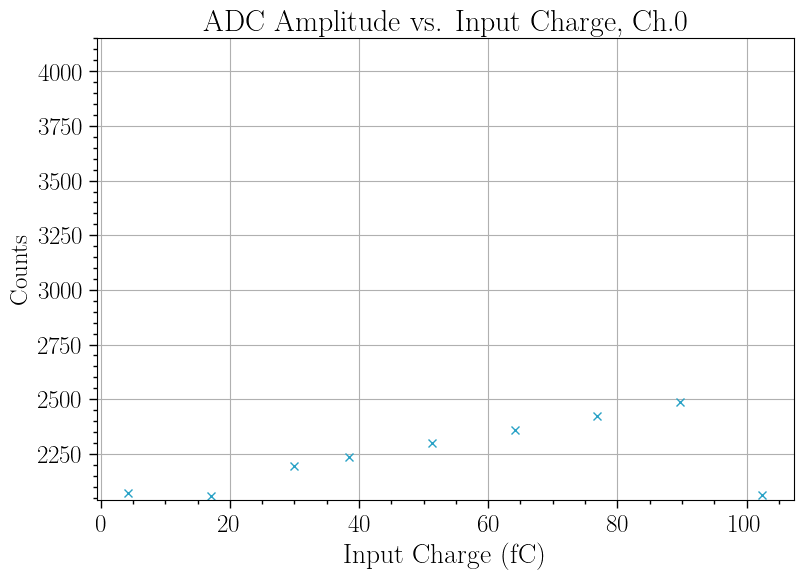

In [14]:
plot_peaks_vs_Q(channels=[0], overlay=0, zoom=0, saveas='')

### Linear Fit and ADC Characteristics

In [15]:
def line(params, x, y):
    m, b = params
    return np.sum((y - (m * x + b)) ** 2)

def linearity(channels, range=[0,10], zoom=0, saveas=''):
    for c in channels:
        peaks, Q = findpeaks([c])
        peaksrange = np.array(peaks[c][range[0]:range[1]])
        Qrange = np.array(Q[c][range[0]:range[1]])

        guess = [1.0, 2048.0]
        
        # perform the minimization
        result = minimize(line, guess, args=(Qrange, peaksrange))
        
        # results
        m, b = result.x

        # calculate calibration params
        res = m # counts/fC
        dyn_range = 4096*1/res # fC
        sat_point = (4095-b)/res # fC

        Vdiv = (1/11) # preamp voltage divider
        Cin = 1 # preamp input capacitance, in pF
        
        res_V = Vdiv*(m * 10**15)*(Cin * 10**-12)* 10**-3 # counts/mV
        dyn_range_V = 4096*1/res_V * 10**-3 # V
        sat_point_V = (4095-b)/res_V * 10**-3 # V

        # plot
        plt.figure(figsize=[9,6])
        plt.plot(Q[c], peaks[c], marker='o', fillstyle='none', linestyle='None')
        x_range = np.linspace(0, sat_point, 100)
        plt.plot(x_range, (m*x_range + b), color=colors[0], alpha =0.3)
        plt.axhline(y=4095, color='r', alpha=0.5, linestyle='--', label='Saturation')
        plt.title(f'ADC Amplitude vs. Input Charge, Ch.{c}')
        plt.gca().set_xlim(left=0)
        if zoom!=0: plt.ylim(zoom[0], zoom[1])
        else: plt.ylim(plt.ylim()[0], 4150)
        plt.xlabel('Input Charge (fC)', fontsize=20)
        plt.ylabel('Counts')
        plt.legend()
        plt.grid(True)
        if saveas: plt.savefig(f'{savedir}/ADCAmpvsChargeLinearFitCh{c}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()

        # tabulate and display params
        params = {
            "Parameter": ["Resolution", "Dynamic Range", "Saturation Point"],
            "Charge": [f'{round(res,2)} counts/fC', f'{round(dyn_range,2)} fC', f'{round(sat_point,2)} fC'],
            "Volts": [f'{round(res_V,2)} counts/mV', f'{round(dyn_range_V,2)} V', f'{round(sat_point_V,2)} V']
        }
        params_df = pd.DataFrame(params)
        display(params_df)
    return

**`linearity()` takes the following inputs:**
- `channels`: list of channels to plot
- `range`: anticipated linearity region to apply the fit; `range=[0,5]` sets the linear region from the 0th to the 5th index of `peaks`
- `zoom`: y-axis zoom. `zoom=[2048, 2500]` sets the y-axis limits from 2048 to 2500 ADC counts. set `zoom=0` for default (minimum amplitude to 4150)
- `saveas`: file extension to save plot ('pdf', 'png', 'jpg', etc.). plots will be saved to `savedir`. set `save=''` for no saving

[180, 181, 182, 183, 184, 185, 186, 187, 188]


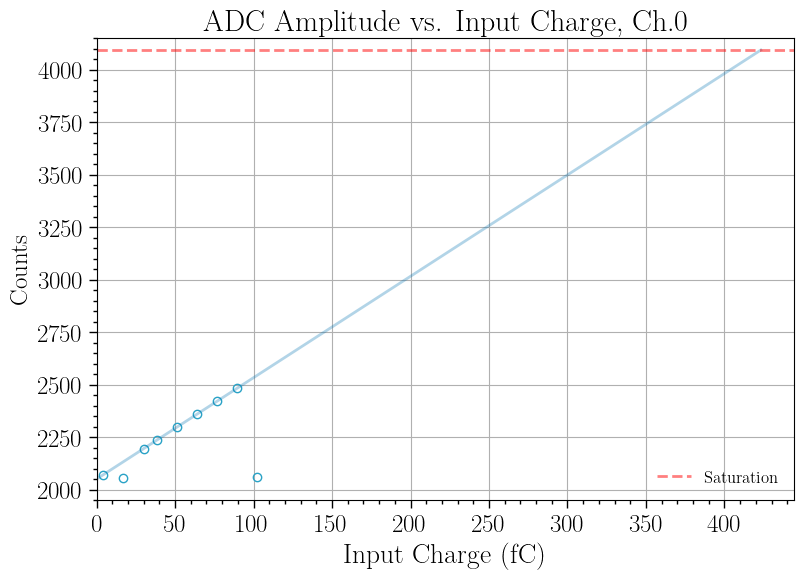

,Parameter,Charge,Volts
0,Resolution,4.83 counts/fC,0.44 counts/mV
1,Dynamic Range,848.22 fC,9.33 V
2,Saturation Point,423.19 fC,4.66 V


: 

In [16]:
linearity(channels=[0], range=[2,6], saveas='png')

## Noise Analysis

The noise analysis expects baseline runs (no pulses). The following function is available:
- **Baseline Histograms**: `noise_hist()` histograms ADC counts and fits a Gaussian to the result. Returns baseline and RMS values in dictionaries indexable by channel number.

`noise_counts()` and `gaussian` are necessary helper functions.

In [ ]:
def noise_counts(file_list, channels):
    counts = {}
    for filename in file_list:
        df = df_dict[filename]
        inds = change_inds[filename]
        nsamps = inds[1][1]

        for ch in channels:
            selected_samples = select_all_events_for_channel(df, inds, ch)
            counts[ch] = []
            for i in range(len(selected_samples)-1):
                adc_counts = selected_samples[i+1]['adc_count']
                if(len(adc_counts)!=nsamps):
                    print('Ch: {} Event: {} Found missing adc counts. {} instead of {}'.format(ch, i+1, len(adc_counts), nsamps))
                else:
                    counts[ch].append(selected_samples[i+1]['adc_count'].values)
            counts[ch] = np.concatenate(counts[ch])
    return counts

def gaussian(x, mean, std):
    return 1 / (std * np.sqrt(2 * np.pi)) * np.exp(-(x - mean)**2 / (2 * std**2))

In [ ]:
def noise_hist(file_list, counts, channels, range=50, num_bins=80, subplot=3, saveas=''):
    # based on input range and desired num_bins, create bins
    bins = np.linspace(2048 - (range/2), 2048 + (range/2), num_bins)
    baselines = {} 
    rms = {}

    # if there is only one input channel, automatically turn off subplot
    if len(channels)==1: subplot=0

    # if subplot is enabled, find number of rows necessary and initialize plot
    if subplot:
        rows = len(channels) // subplot + (len(channels) % subplot > 0)
        if len(channels)>=subplot: 
            _, axs = plt.subplots(rows, subplot, figsize=(14, 4*rows))
        else: 
            _, axs = plt.subplots(rows, len(channels), figsize=(14, 4*len(channels)))
        
    for i, ch in enumerate(channels):
        if subplot:
            row = i//subplot # row index
            col = i%subplot # column index
            ax = axs[row, col]
        else:
            plt.figure(figsize=(7, 6))
            ax = plt.gca()
        
        # create histogram for current channel, find bin midpoints
        hist, bin_edges = np.histogram(counts[ch], bins=bins, density=True)
        midpoints = 0.5 * (bin_edges[1:] + bin_edges[:-1])

        # fit gaussian to midpoints, initial guess based on mean and std of counts
        params, _ = curve_fit(gaussian, midpoints, hist, [np.mean(counts[ch]), np.std(counts[ch])])
        mean, std = params
        baselines[ch] = (mean)
        rms[ch] = std

        # plot histogram
        ax.hist(counts[ch], bins=bins, histtype='step', color=colors[0], density=True)
        
        # plot fitted gaussian
        x = np.linspace(min(bins), max(bins), 100)
        fit = gaussian(x, mean, std)
        ax.fill_between(x, 0, fit, color=colors[9], alpha=0.5, label='Gaussian Fit')

        # plot expected and actual baseline positions
        ax.axvline(2048, color='r', ls='--', alpha=0.5, label='Expected BL')   
        ax.axvline(mean, color='r', ls='--', label='Actual BL')

        # title and legend
        ax.set_title(f'Baseline Counts for Ch. {ch}')
        ax.legend()
        
    plt.tight_layout()
    if saveas: plt.savefig(f'{savedir}/BaselineCountsRun{file_list}.{saveas}', dpi=400, bbox_inches='tight') # save plot

    # tabulate and display results
    results = {
        "Ch": list(baselines.keys()),
        "Mean Counts": list(baselines.values()),
        "RMS Counts": list(rms.values())
    }
    results_df = pd.DataFrame(results)
    display(results_df)
        
    return baselines, rms

In [ ]:
channels = [5]
file_list = [100]
counts = noise_counts(file_list, channels)
baselines, rms = noise_hist(file_list, counts, channels, 60, 50, 3, '')

In [ ]:
channels = [5]
file_list = [101]
counts = noise_counts(file_list, channels)
baselines, rms = noise_hist(file_list, counts, channels, 60, 50, 3, '')

In [ ]:
channels = [key for key in counts.keys()]
noise_rms = []
for ch in channels:
    mean = np.mean(counts[ch])
    squared_diffs = (counts[ch] - mean) ** 2
    mean_squared_diff = np.mean(squared_diffs)
    noise_rms.append(np.sqrt(mean_squared_diff))

print(channels, noise_rms)
    
plt.figure(figsize=[10,5])
# plt.step(channels, noise_rms, color=colors[0], where='mid')
plt.bar(channels, noise_rms, color=colors[0])
plt.xlabel('Channel', fontsize=20)
plt.ylabel('ADC Counts', fontsize=20)
plt.title('Noise RMS: ADC')
# plt.savefig(f'{savedir}/NoiseRMSADC.png', dpi=400, bbox_inches='tight')
plt.grid()
plt.show()

## Pulse Fitting

In [ ]:
def trim_pulse(file_list, channel, baseline=None, saveas=''):
    # if provided, use measured baseline
    if baseline: baseline = baselines[channel]
    else: baseline = 2048 # otherwise default to 2048
    print(baseline)

    for filename in file_list:
        inds = change_inds[filename]
        df = df_dict[filename]
        nsamps = inds[1][1]
        sum_counts = np.zeros(nsamps)

        # create time axis (2 MHz sampling rate -> 0.5 us steps)
        time = 0.5*np.arange(nsamps)
        selected_samples = select_all_events_for_channel(df, inds, channel)
        plt.figure(figsize=[8,6])
        
        for i in range(len(selected_samples)):
            adc_counts = selected_samples[i]['adc_count']
            if(len(adc_counts)!=nsamps):
                print('Ch: {} Event: {} Found missing adc counts. {} instead of {}'.format(channel, i+1, len(adc_counts), nsamps))
            else:
                sum_counts  += adc_counts.values
    
        avg_counts = sum_counts / len(selected_samples)
        

        # take first peak
        
        # take absolute value and subtract baseline from averaged counts; then find maximum and corresponding index
        absolute_counts = np.abs(avg_counts - baseline)
        max_counts = np.max(absolute_counts)
        max_ind = np.argmax(absolute_counts)
        
        threshold = 0.1 * max_counts
        
        # scan right before the pulse maximum to find the start point for the given threshold
        start_ind = -1 # init start (use -1 in case index ends up being zero)
        padding = 3 # number of extra indices to pad trimmed window with (adds to start and stop indices)
        cursor = 0
        while start_ind==-1:
            if absolute_counts[max_ind - cursor] <= threshold and start_ind==-1:
                start_ind = max_ind - cursor - padding
            cursor += 1

        # for now, ignoring exp decay and pretending the pulse is a symmetrical gaussian; so we set the stop point to be symmetrically placed after the max counts
        stop_ind = (max_ind-start_ind)+max_ind+45
        
        # return time and counts arrays sliced at start and stop points
        time = time[start_ind:stop_ind] - (0.5*max_ind)
        counts = absolute_counts[start_ind:stop_ind]

        # plot sliced arrays
        plt.plot(time, counts)
        plt.title(f'Trimmed Average Pulse for Channel {channel}, Run {filename}')
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.xlim(time[0], time[-1])
        plt.ylim(0, max_counts+(0.05*max_counts))
        plt.grid(True)
        if saveas: plt.savefig(f'{savedir}/TrimmedPulse_Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
        
    return time, counts, max_ind

In [ ]:
time, counts, max_ind = trim_pulse(file_list=[48], channel=8, baseline=baselines, saveas='')

In [ ]:
def doubleexp(x, a, tau1, tau2):
        t0 = tau1*tau2*(np.log(tau1)-np.log(tau2))/(tau2-tau1)
        return a*(tau1*np.exp(-(x-t0)/tau1) - tau2*np.exp(-(x-t0)/tau2))/(tau1-tau2)

### Ex-Gaussian Fit

In [ ]:
def exgaussian(x, a, u, std, l):
        return  a * np.sqrt(np.pi/2) * (0.5*l) * np.exp((0.5*l)*(2*u + l * std**2 - 2*x))*special.erfc((u+ l * std**2 - x)/(np.sqrt(2)*std))

def pulse_fit(time, counts, max_ind):
        # fit ex-gaussian to trimmed pulse, initial guess based on max index location and std of counts
        params, _ = curve_fit(exgaussian, time[0:len(time)], counts[0:len(time)])

        a, u, std, l = params
        print("amplitude: ", a)
        print("mean: ", u) 
        print("standard dev: ", std)      
        print("lambda: ", l)

        # ex-gaussian
        fit = exgaussian(time, a, u, std, l)

        # plot pulse and fit
        plt.plot(time, counts, label="Pulse")
        plt.plot(time, fit, label="Fit")

        # title and legend
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.legend(loc="best")
        plt.grid(True)
        plt.xlim(-5, None)
        plt.ylim(0, 4096)
        # if saveas: plt.savefig(f'{savedir}/TrimmedPulse_Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
        return

In [ ]:
pulse_fit(time, counts, max_ind)

### Double Exponential Fit

In [ ]:
def doubleexp(x, tau1, tau2):
    # ensure that tau1 and tau2 are positive and not equal
    if tau1 <= 0 or tau2 <= 0:
        return np.full_like(x, np.inf)  # return inf to indicate a poor fit
    if tau1 == tau2:
        return np.full_like(x, np.inf)  # avoid division by zero
    
    t0 = tau1*tau2*(np.log(tau2)-np.log(tau1))/(tau2-tau1)
    y = (tau1*np.exp(-(x-t0)/tau1) - tau2*np.exp(-(x-t0)/tau2))/(tau1-tau2)
    
    # remove potential non-finite values caused by numerical issues
    y[~np.isfinite(y)] = np.nan
    return y

def pulse_fit(time, counts, max_ind):
        params, _ = curve_fit(doubleexp, time[10:len(time)], counts[10:len(time)], [100, 500])

        tau1, tau2 = params

        # doubleexp
        print(tau1, tau2)
        fit = doubleexp(time, tau1, tau2)

        # plot pulse and fit
        plt.plot(time, counts, label="Pulse")
        plt.plot(time, fit, label="Fit")

        # title and legend
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.legend(loc="best")
        plt.grid(True)
        plt.xlim(-5, None)
        plt.ylim(0, 4096)
        # if saveas: plt.savefig(f'{savedir}/TrimmedPulse_Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
        return

In [ ]:
pulse_fit(time, counts, max_ind)

### Gumbel Fit

In [ ]:
def gumbel(x, a, u, beta):
    z = (x - u)/beta
    return a * (1/beta) * np.exp(-z-np.exp(-z))

def pulse_fit(time, counts, max_ind):
        params, _ = curve_fit(gumbel, time[0:len(time)], counts[0:len(time)])

        a, u, beta = params

        # doubleexp
        print(a, u, beta)
        fit = gumbel(time, a, u, beta)

        # plot pulse and fit
        plt.plot(time, counts, label="Pulse")
        plt.plot(time, fit, label="Fit")

        # title and legend
        plt.xlabel('Time (us)')
        plt.ylabel('ADC Counts')
        plt.legend(loc="best")
        plt.grid(True)
        plt.xlim(-5, None)
        plt.ylim(0, 4096)
        # if saveas: plt.savefig(f'{savedir}/TrimmedPulse_Run{filename}.{saveas}', dpi=400, bbox_inches='tight')
        plt.show()
        return

In [ ]:
pulse_fit(time, counts, max_ind)

## Crosstalk

In [ ]:
#Get counts for all channels

def counts_per_channel(file_list):
#inputs: list of files you would like plotted, channel number of interest, event number of interest, and overlay on or off 
    t=0
    counts = dict()
    nloops = 0
    #Loop over files
    for filename in file_list:
        df = df_dict[filename]
        # find FEM ID for run
        fem_id = 14 #csv.loc[csv['File ID'] == filename, 'FEM ID'].iloc[0]
        # filter data by FEM and desired channel
        fem_mask = df['fem_id']==fem_id

        #get all event ids in file
        all_evs = np.unique(df['event_id'])
        
        #remove any active channel if passed
        all_chs = np.unique(df['channel_id'])
        t1 = time.time()
        #loop over channels
        for ch in all_chs:
            counts[ch] = []
            nloops+=1
            #loop over events
            #t2 = time.time()
            ch_mask = (df['channel_id']==ch) & (fem_mask)
            for ev in all_evs[:10]:
                t2 = time.time()
                mask = (ch_mask) & (df['event_id']==ev)
                t4 = time.time()
                t+=(t4-t2)
                adc_counts = df['adc_count'][mask]
                if nloops<2:
                    nsamps = len(adc_counts)
                if(len(adc_counts)!=nsamps):
                    print('Skipping Ch: {} Event: {}. Found {} missing samples'.format(ch, ev, abs(len(adc_counts)-nsamps)))
                else:
                    counts[ch].append(adc_counts)
                    #sum_squares.append(adc_counts ** 2)
        t3 = time.time()
        channels = [key for key in counts.keys()]
        counts = {ch: np.concatenate(counts[ch]) for ch in channels}
        print(t3-t1)
    return channels, counts

In [ ]:
channels, counts = counts_per_channel(file_list)

In [ ]:
channels = sorted(counts.keys())
adc_counts = np.array([counts[ch] for ch in channels])
adc_counts = adc_counts.T
# Normalize ADC counts to zero mean and unit variance
normalized_adc_counts = (adc_counts - np.mean(adc_counts, axis=0)) / np.std(adc_counts, axis=0)
# Compute correlation matrix
correlation_matrix = np.corrcoef(normalized_adc_counts, rowvar=False)

#Compute covariance matrix
#covariance_matrix = np.cov(normalized_adc_counts, rowvar=False)

#plt.figure(figsize=(10, 8))
#sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
#plt.title('Cross-Talk Correlation Matrix')
#plt.xlabel('Channels')
#plt.ylabel('Channels')
#plt.show()


### Correlation of active channel with other channels

In [ ]:
plt.figure(figsize=[12,5])
plt.plot(channels, correlation_matrix[14], color=colors[0], label='Correlation with Ch. {}'.format(active_ch))
plt.xlabel('Channel Number')
plt.ylabel('Correlation'.format(active_ch))
plt.axhline(0, color='black', linewidth=0.8)

plt.legend()
plt.show()

### 2D correlation matrix 

In [ ]:
plt.figure(figsize=[10,8])
ax = sns.heatmap(correlation_matrix, vmin=-1, vmax=1, cmap='PiYG', center=0, cbar_kws={'label': 'Correlation'})
ax.invert_yaxis()
ax.set_xlabel('Channel', fontsize=24)
ax.set_ylabel('Channel', fontsize=24)
plt.show()

In [ ]:
#Get noise counts for all channels (except for active one) for noise measurements

def noise_counts(file_list, active_ch):
#inputs: list of files you would like plotted, channel number of interest

    counts = dict()
    nloops = 0
    #Loop over files
    for filename in file_list:
        df = df_dict[filename]
        # find FEM ID for run
        fem_id = csv.loc[csv['File ID'] == filename, 'FEM ID'].iloc[0]
        # filter data by FEM and desired channel
        fem_mask = df['fem_id']==fem_id

        #get all event ids in file
        all_evs = np.unique(df['event_id'])
        
        #remove any active channel if passed
        all_chs = np.unique(df['channel_id'])
        non_active = np.delete(all_chs, np.where(all_chs==active_ch)[0][0])

        #loop over channels
        for ch in non_active:
            counts[ch] = []
            nloops+=1
            #loop over events
            for ev in all_evs[:1]:
                mask = np.logical_and(fem_mask, np.logical_and(df['event_id']==ev, df['channel_id']==ch))
                adc_counts = df['adc_count'][mask]
                if nloops<2:
                    nsamps = len(adc_counts)
                if(len(adc_counts)!=nsamps):
                    print('Skipping Ch: {} Event: {}. Found {} missing samples'.format(ch, ev, abs(len(adc_counts)-nsamps)))
                else:
                    counts[ch].append(adc_counts)
                    #sum_squares.append(adc_counts ** 2)
        
        channels = [key for key in counts.keys()]
        counts = {ch: np.concatenate(counts[ch]) for ch in channels}

    return counts

## Txt Decoder

In [ ]:
import re
from collections import defaultdict

# Initialize data structures
events = []
current_event = None

# Regular expressions for parsing
event_start_pattern = re.compile(r'^\s*=====> New event:\s+(\d+)')
event_end_pattern = re.compile(r'^\s*=====> End of event')
module_address_pattern = re.compile(r'^\s*Module address:\s+(\d+)')
tpc_channel_start_pattern = re.compile(r'^\s*TPC Channel (\d+) begin')
adc_count_pattern = re.compile(r'^\s*ADC [Cc]ount:\s+(\d+)')  # Adjusted to capture both 'Count' and 'count'
tpc_channel_end_pattern = re.compile(r'^\s*TPC Channel (\d+) end')
roi_found_pattern = re.compile(r'^\s*ROI found in channel (\d+)')
roi_sample_pattern = re.compile(r'^\s*ROI Sample:\s+(\d+)')
roi_frame_pattern = re.compile(r'^\s*ROI Frame:\s+(\d+)')
trigger_time_pattern = re.compile(r'^\s*Trigger time. Frame:\s+(\d+)\s+Sample:\s+(\d+)')

# Helper to add a new event
def start_new_event(event_number):
    return {
        'event_number': event_number,
        'tpc_adc_counts': defaultdict(list),
        'light_fem': [],
        'trigger_time': None  # To store trigger time (frame and sample)
    }

# Read and parse file
with open(f'{GRAMSdir}/{testdir}/pGRAMS_decoded_102.txt', 'r') as file:
    for line in file:
        # Check for the start of a new event
        event_start_match = event_start_pattern.match(line)
        if event_start_match:
            if current_event:
                events.append(current_event)
            current_event = start_new_event(int(event_start_match.group(1)))
            continue

        # Check for the end of the event
        if event_end_pattern.match(line):
            if current_event:
                events.append(current_event)
                current_event = None
            continue

        # Detect trigger time
        trigger_time_match = trigger_time_pattern.match(line)
        if trigger_time_match and current_event:
            current_event['trigger_time'] = {
                'frame': int(trigger_time_match.group(1)),
                'sample': int(trigger_time_match.group(2))
            }
            continue

        # Detect module address
        module_match = module_address_pattern.match(line)
        if module_match:
            current_module = int(module_match.group(1))
            continue

        # Detect TPC channel start
        tpc_channel_start_match = tpc_channel_start_pattern.match(line)
        if tpc_channel_start_match:
            current_tpc_channel = int(tpc_channel_start_match.group(1))
            continue

        # Detect TPC channel end
        if tpc_channel_end_pattern.match(line):
            current_tpc_channel = None
            continue

        # Detect ADC counts within TPC or Light FEM
        adc_match = adc_count_pattern.match(line)
        if adc_match:
            adc_value = int(adc_match.group(1))
            if current_tpc_channel is not None:
                current_event['tpc_adc_counts'][current_tpc_channel].append(adc_value)
            elif 'current_roi' in locals():
                current_roi['adc_counts'].append(adc_value)
            continue

        # Detect ROI found in Light FEM
        roi_found_match = roi_found_pattern.match(line)
        if roi_found_match:
            current_roi = {
                'channel': int(roi_found_match.group(1)),
                'frame': None,
                'sample': None,
                'adc_counts': []
            }
            current_event['light_fem'].append(current_roi)
            continue

        # Detect ROI Sample and Frame for Light FEM
        roi_sample_match = roi_sample_pattern.match(line)
        if roi_sample_match and 'current_roi' in locals():
            current_roi['sample'] = int(roi_sample_match.group(1))
            continue

        roi_frame_match = roi_frame_pattern.match(line)
        if roi_frame_match and 'current_roi' in locals():
            current_roi['frame'] = int(roi_frame_match.group(1))
            continue
    
    
    # for channel in np.unique(roi['channel'].values()):
    #     print(channel)
    #     # Determine the smallest frame number to set as the baseline              ###HEREEE HELP ME !##
    #     min_frame_number = min(roi['frame'] for roi in event['light_fem'])
    
    # # Define an array for four frames of Light FEM data, filled with default value of 2000
    # light_fem_adc_data = 2000 * np.ones(4 * num_samples_per_frame)

    # # Place each ROI in the Light FEM array based on adjusted frame and sample position
    # for roi in event['light_fem']:
    #     print(roi)
    #     # Adjust frame offset by subtracting the baseline frame number
    #     adjusted_frame = roi['frame'] - min_frame_number
    #     frame_offset = adjusted_frame * num_samples_per_frame
    #     sample_offset = roi['sample']
        
    #     # Calculate start index for ROI within the Light FEM array
    #     roi_start_index = frame_offset + sample_offset
    #     adc_counts_length = len(roi['adc_counts'])

    #     # Place ADC counts within Light FEM array bounds
    #     end_index = min(roi_start_index + adc_counts_length, len(light_fem_adc_data))
    #     if 0 <= roi_start_index < len(light_fem_adc_data):
    #         light_fem_adc_data[roi_start_index:end_index] = roi['adc_counts'][:end_index - roi_start_index]

    # # Calculate the trigger index in the Light FEM array
    # trigger_frame_index = (event['trigger_time']['frame'] - min_frame_number) * num_samples_per_frame
    # trigger_sample_offset = event['trigger_time']['sample'] * 32  # Convert to 64 MHz
    # trigger_index = trigger_frame_index + trigger_sample_offset

    # # Generate Light FEM time axis in nanoseconds and shift to be relative to the trigger
    # light_fem_time = (np.arange(len(light_fem_adc_data)) - trigger_index) * light_fem_sample_interval

    # # === Plotting ===
    # plt.figure(figsize=(14, 6))

    # # TPC ADC data in microseconds
    # plt.subplot(2, 1, 1)
    # plt.plot(tpc_time, tpc_adc_data, label="TPC ADC Data")
    # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time")
    # plt.xlabel("Time (μs)")
    # plt.ylim(1750, 2350)
    # plt.xlim(-1.5, 10)
    # plt.ylabel("TPC ADC Counts")
    # plt.legend()

    # # Light FEM data in nanoseconds
    # plt.subplot(2, 1, 2)
    # plt.plot(light_fem_time, light_fem_adc_data, label="Light FEM ADC Data")
    # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time (reference)")

    # # Mark frame boundaries for Light FEM data relative to the trigger
    # for i in range(4):
    #     frame_start_time = (i * num_samples_per_frame - trigger_index) * light_fem_sample_interval
    #     frame_end_time = ((i + 1) * num_samples_per_frame - trigger_index) * light_fem_sample_interval

    #     # Draw frame boundary lines
    #     plt.axvline(x=frame_start_time, color='g', linestyle='--', label=f"Frame {i+1} Start" if i == 0 else "")
    #     plt.axvline(x=frame_end_time, color='b', linestyle='--', label=f"Frame {i+1} End" if i == 0 else "")

    # plt.xlabel("Time relative to trigger (ns)")
    # plt.ylabel("Light FEM ADC Counts")
    # plt.xlim(-1500, 10000)
    # plt.title(f"Light FEM Data for Event {event['event_number']} with Frame Boundaries")
    # plt.legend()

    # plt.tight_layout()
    # plt.show()

In [ ]:
# Define sampling intervals
tpc_sample_interval = 0.5  # TPC: 2 MHz => 0.5 microseconds per sample
light_fem_sample_interval = 15.625  # Light FEM: 64 MHz => 15.625 nanoseconds per sample

# Number of samples per frame in Light FEM data
num_samples_per_frame = 199 * 32  # 199 samples at 2MHz converted to 64MHz

# Plot each event's data
for event in events[:1]:
    # === TPC Data ===
    # Collect and plot TPC ADC counts
    for ch in event['tpc_adc_counts'].keys():
        tpc_adc_data = []
        tpc_adc_data.extend(event['tpc_adc_counts'][ch])
        tpc_time = (np.arange(len(tpc_adc_data)) - 199) * tpc_sample_interval
        plt.figure(figsize=[14, 6])
        # TPC ADC data in microseconds
        #plt.subplot(2, 1, 1)
        plt.plot(tpc_time, tpc_adc_data, label="TPC ADC Data channel {}".format(ch))
        # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time")
        plt.xlabel("Time ($\\mu$ s)")
        plt.ylim(1850, 2250)
        plt.xlim(-100, 200)

        plt.ylabel("TPC ADC Counts")
        #plt.show()
        plt.legend()
        plt.show()

    #for channel_counts in event['tpc_adc_counts'].values():
    #    tpc_adc_data.extend(channel_counts)
    
    # Ensure we have enough data points (3 frames worth)
    #if len(tpc_adc_data) < 3 * 199:
    #    tpc_adc_data.extend([0] * (3 * 199 - len(tpc_adc_data)))
    
    # TPC time axis in microseconds, with the 200th sample aligned to the trigger

    #print(tpc_adc_data)
    # === Light FEM Data ===
    #try:
    #    unique_channels = {roi['channel'] for roi in event['light_fem']}  # Find all unique channels
    #    min_frame_number = min(roi['frame'] for roi in event['light_fem'])  # Determine the baseline frame number

    #except:
    #    unique_channels = {}

In [ ]:
# Define sampling intervals
tpc_sample_interval = 0.5  # TPC: 2 MHz => 0.5 microseconds per sample
light_fem_sample_interval = 15.625  # Light FEM: 64 MHz => 15.625 nanoseconds per sample

# Number of samples per frame in Light FEM data
num_samples_per_frame = 199 * 32  # 199 samples at 2MHz converted to 64MHz

# Plot each event's data
for event in events[:1]:
    # === TPC Data ===
    # Collect and plot TPC ADC counts
    for ch in event['tpc_adc_counts'].keys():
        tpc_adc_data = []
        tpc_adc_data.extend(event['tpc_adc_counts'][ch])
        tpc_time = (np.arange(len(tpc_adc_data)) - 199) * tpc_sample_interval
        plt.figure(figsize=[14, 6])
        # TPC ADC data in microseconds
        #plt.subplot(2, 1, 1)
        plt.plot(tpc_time, tpc_adc_data, label="TPC ADC Data channel {}".format(ch))
        # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time")
        plt.xlabel("Time ($\\mu$ s)")
        plt.ylim(1850, 2250)
        plt.xlim(-100, 200)

        plt.ylabel("TPC ADC Counts")
        #plt.show()
        plt.legend()
        plt.show()

    #for channel_counts in event['tpc_adc_counts'].values():
    #    tpc_adc_data.extend(channel_counts)
    
    # Ensure we have enough data points (3 frames worth)
    #if len(tpc_adc_data) < 3 * 199:
    #    tpc_adc_data.extend([0] * (3 * 199 - len(tpc_adc_data)))
    
    # TPC time axis in microseconds, with the 200th sample aligned to the trigger

    #print(tpc_adc_data)
    # === Light FEM Data ===
    #try:
    #    unique_channels = {roi['channel'] for roi in event['light_fem']}  # Find all unique channels
    #    min_frame_number = min(roi['frame'] for roi in event['light_fem'])  # Determine the baseline frame number

    #except:
    #    unique_channels = {}

In [ ]:
chhhc = 0
    for channel in unique_channels:
        if(chhhc==0):
            chhhc+=1
            # Define an array for four frames of Light FEM data, filled with default value of 2000
            light_fem_adc_data = 2048 * np.ones(4 * num_samples_per_frame)
        
            # Filter ROIs for the current channel
            channel_rois = [roi for roi in event['light_fem'] if roi['channel'] == channel]
        
            # Place each ROI for the current channel in the Light FEM array
            for roi in channel_rois:
                # Adjust frame offset by subtracting the baseline frame number
                adjusted_frame = roi['frame'] - min_frame_number
                frame_offset = adjusted_frame * num_samples_per_frame
                sample_offset = roi['sample']
        
                # Calculate start index for ROI within the Light FEM array
                roi_start_index = frame_offset + sample_offset
                adc_counts_length = len(roi['adc_counts'])
        
                # Place ADC counts within Light FEM array bounds
                end_index = min(roi_start_index + adc_counts_length, len(light_fem_adc_data))
                if 0 <= roi_start_index < len(light_fem_adc_data):
                    light_fem_adc_data[roi_start_index:end_index] = roi['adc_counts'][:end_index - roi_start_index]
    
        # Calculate the trigger index in the Light FEM array
        trigger_frame_index = (event['trigger_time']['frame'] - min_frame_number) * num_samples_per_frame
        trigger_sample_offset = event['trigger_time']['sample'] * 32  # Convert to 64 MHz
        trigger_index = trigger_frame_index + trigger_sample_offset
    
        # Generate Light FEM time axis in nanoseconds and shift to be relative to the trigger
        light_fem_time = (np.arange(len(light_fem_adc_data)) - trigger_index) * light_fem_sample_interval

        # Light FEM data for the current channel
        plt.subplot(2, 1, 2)
        if(chhhc==1):
            chhhc+=1
            plt.plot(light_fem_time, light_fem_adc_data, label=f"Light FEM ADC Data (Channel {channel})")
            plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time (reference)")
    
        # Mark frame boundaries for Light FEM data relative to the trigger
        #for i in range(4):
        #    frame_start_time = (i * num_samples_per_frame - trigger_index) * light_fem_sample_interval
        #    frame_end_time = ((i + 1) * num_samples_per_frame - trigger_index) * light_fem_sample_interval
    
            # Draw frame boundary lines
        #    plt.axvline(x=frame_start_time, color='g', linestyle='--', label=f"Frame {i+1} Start" if i == 0 else "")
        #    plt.axvline(x=frame_end_time, color='b', linestyle='--', label=f"Frame {i+1} End" if i == 0 else "")
    
        plt.xlabel("Time relative to trigger (ns)")
        plt.ylabel("Light FEM ADC Counts")
        plt.xlim(-1500, 10000)
        #plt.title(f"Light FEM Data for Event {event['event_number']}, Channel {channel}")
        plt.legend()
    
    #plt.tight_layout()
    plt.show()




    

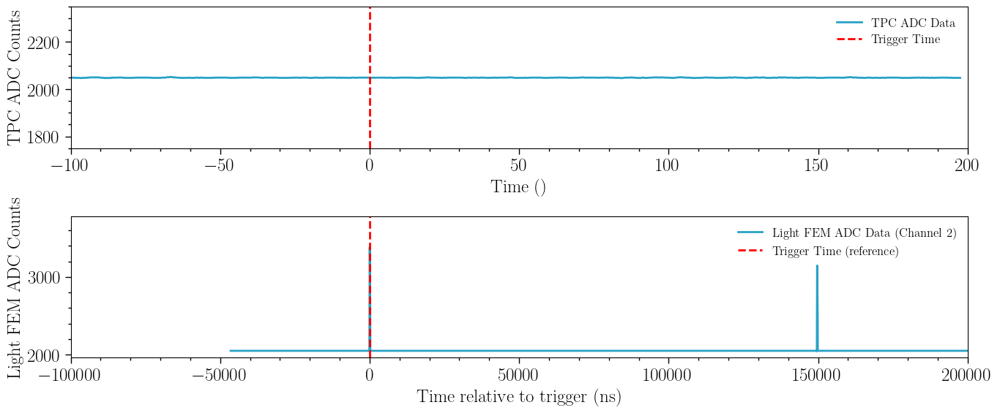

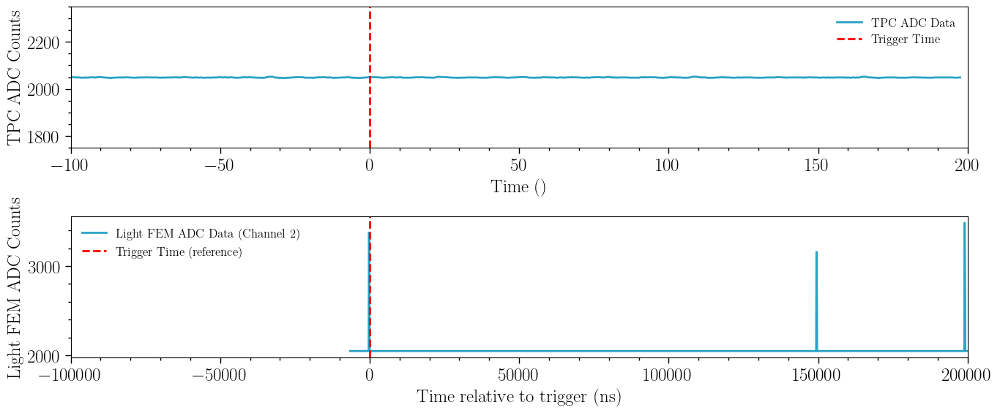

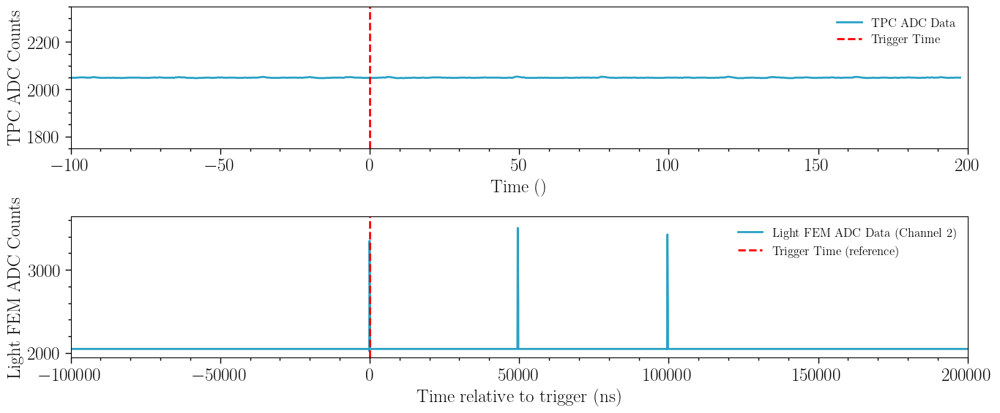

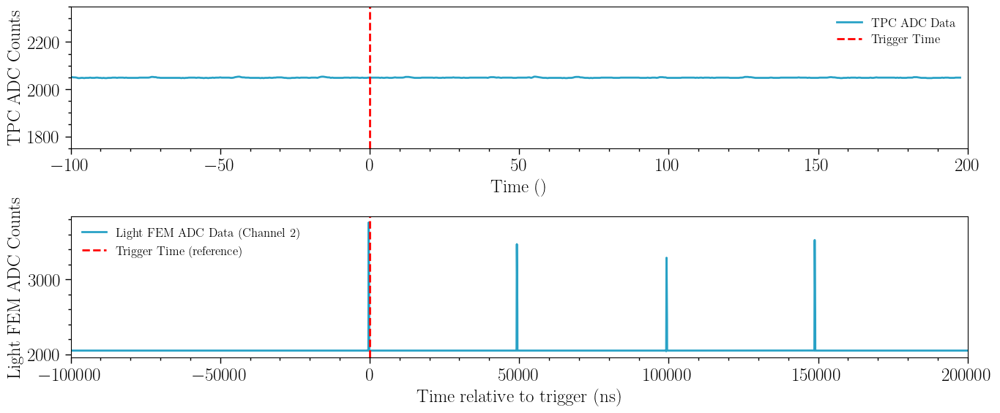

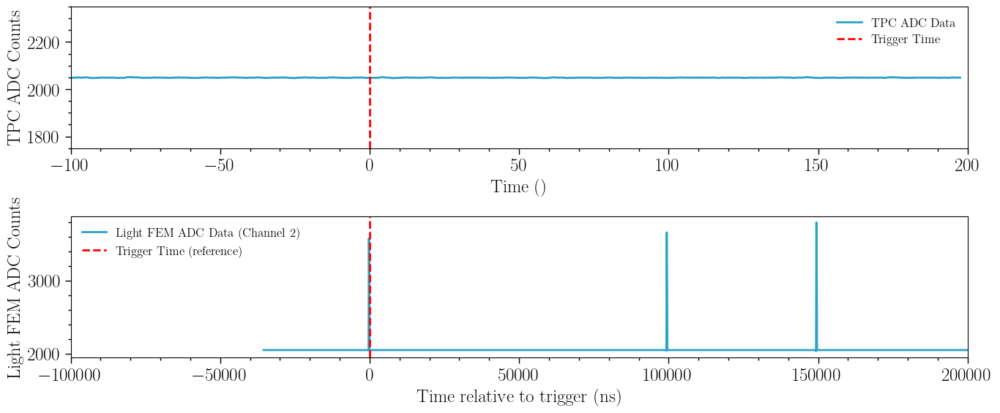

...

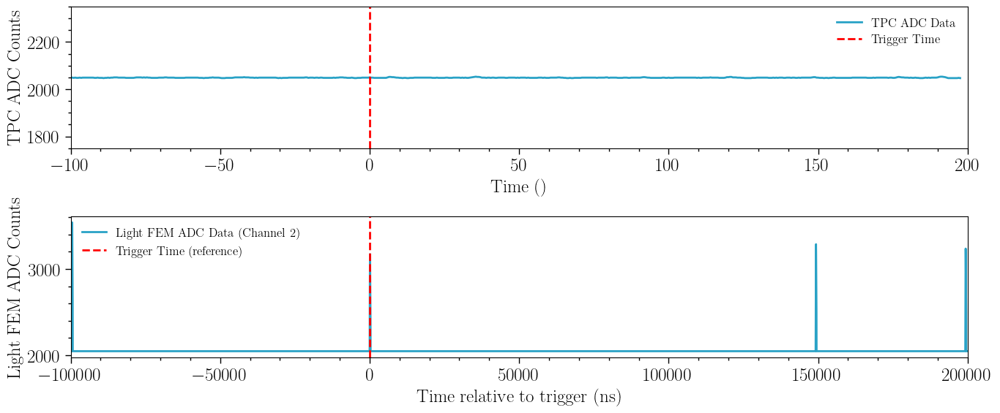

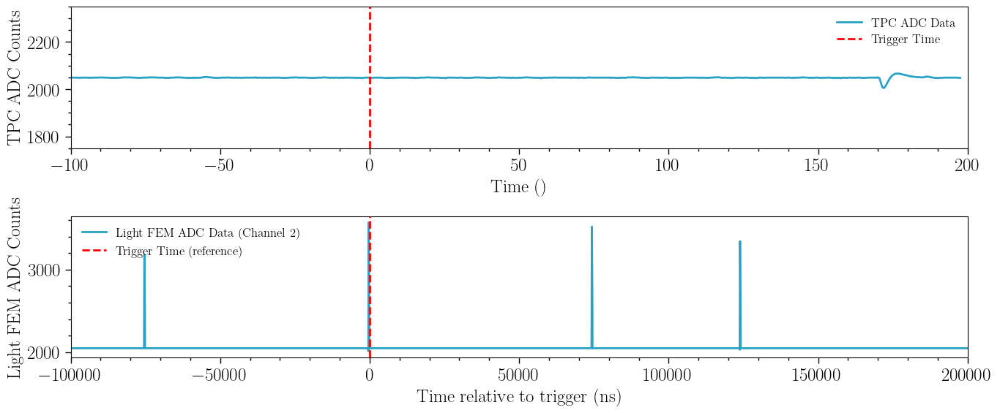

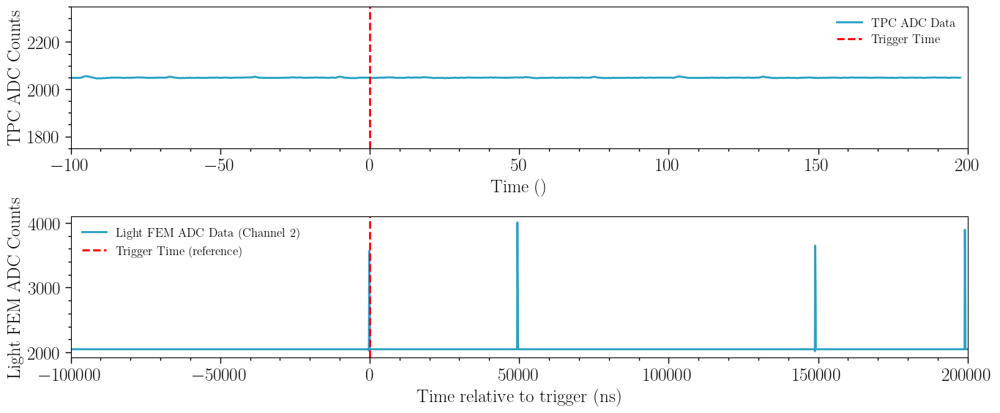

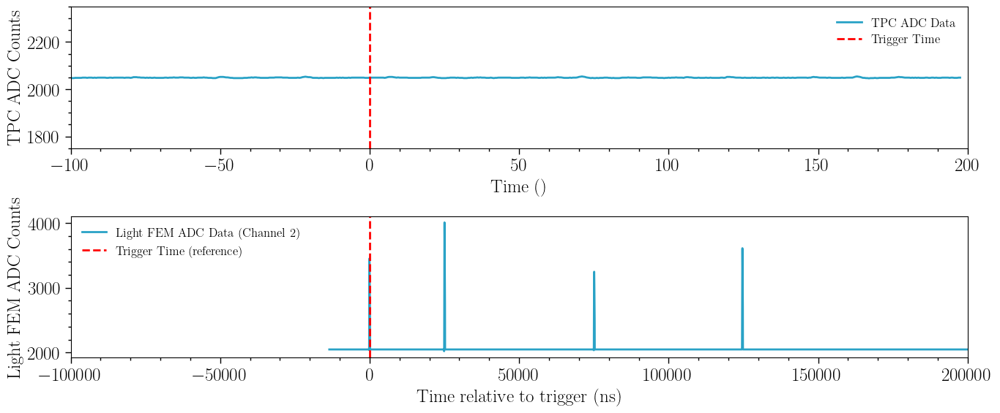

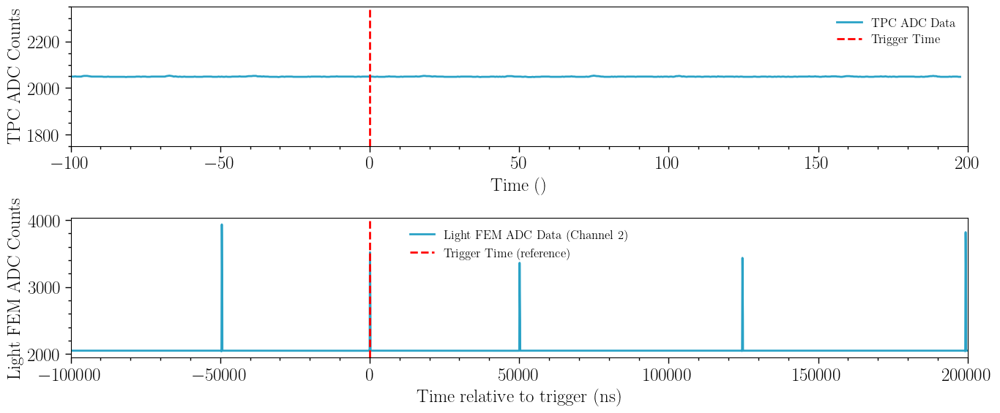

In [63]:
import re
from collections import defaultdict
import matplotlib.pyplot as plt

# Initialize data structures
events = []
current_event = None

# Regular expressions for parsing
event_start_pattern = re.compile(r'^\s*=====> New event:\s+(\d+)')
event_end_pattern = re.compile(r'^\s*=====> End of event')
module_address_pattern = re.compile(r'^\s*Module address:\s+(\d+)')
tpc_channel_start_pattern = re.compile(r'^\s*TPC Channel (\d+) begin')
adc_count_pattern = re.compile(r'^\s*ADC [Cc]ount:\s+(\d+)')  # Adjusted to capture both 'Count' and 'count'
tpc_channel_end_pattern = re.compile(r'^\s*TPC Channel (\d+) end')
roi_found_pattern = re.compile(r'^\s*ROI found in channel (\d+)')
roi_sample_pattern = re.compile(r'^\s*ROI Sample:\s+(\d+)')
roi_frame_pattern = re.compile(r'^\s*ROI Frame:\s+(\d+)')
trigger_time_pattern = re.compile(r'^\s*Trigger time. Frame:\s+(\d+)\s+Sample:\s+(\d+)')

# Helper to add a new event
def start_new_event(event_number):
    return {
        'event_number': event_number,
        'tpc_adc_counts': defaultdict(list),
        'light_fem': [],
        'trigger_time': None  # To store trigger time (frame and sample)
    }

# Read and parse file
with open(f'{GRAMSdir}/{testdir}/pGRAMS_decoded_178.txt', 'r') as file:
    for line in file:
        # Check for the start of a new event
        event_start_match = event_start_pattern.match(line)
        if event_start_match:
            if current_event:
                events.append(current_event)
            current_event = start_new_event(int(event_start_match.group(1)))
            continue

        # Check for the end of the event
        if event_end_pattern.match(line):
            if current_event:
                events.append(current_event)
                current_event = None
            continue

        # Detect trigger time
        trigger_time_match = trigger_time_pattern.match(line)
        if trigger_time_match and current_event:
            current_event['trigger_time'] = {
                'frame': int(trigger_time_match.group(1)),
                'sample': int(trigger_time_match.group(2))
            }
            continue

        # Detect module address
        module_match = module_address_pattern.match(line)
        if module_match:
            current_module = int(module_match.group(1))
            continue

        # Detect TPC channel start
        tpc_channel_start_match = tpc_channel_start_pattern.match(line)
        if tpc_channel_start_match:
            current_tpc_channel = int(tpc_channel_start_match.group(1))
            continue

        # Detect TPC channel end
        if tpc_channel_end_pattern.match(line):
            current_tpc_channel = None
            continue

        # Detect ADC counts within TPC or Light FEM
        adc_match = adc_count_pattern.match(line)
        if adc_match:
            adc_value = int(adc_match.group(1))
            if current_tpc_channel is not None:
                current_event['tpc_adc_counts'][current_tpc_channel].append(adc_value)
            elif 'current_roi' in locals():
                current_roi['adc_counts'].append(adc_value)
            continue

        # Detect ROI found in Light FEM
        roi_found_match = roi_found_pattern.match(line)
        if roi_found_match:
            current_roi = {
                'channel': int(roi_found_match.group(1)),
                'frame': None,
                'sample': None,
                'adc_counts': []
            }
            current_event['light_fem'].append(current_roi)
            continue

        # Detect ROI Sample and Frame for Light FEM
        roi_sample_match = roi_sample_pattern.match(line)
        if roi_sample_match and 'current_roi' in locals():
            current_roi['sample'] = int(roi_sample_match.group(1))
            continue

        roi_frame_match = roi_frame_pattern.match(line)
        if roi_frame_match and 'current_roi' in locals():
            current_roi['frame'] = int(roi_frame_match.group(1))
            continue

import numpy as np
import matplotlib.pyplot as plt

# Define sampling intervals
tpc_sample_interval = 0.5  # TPC: 2 MHz => 0.5 microseconds per sample
light_fem_sample_interval = 15.625  # Light FEM: 64 MHz => 15.625 nanoseconds per sample

# Number of samples per frame in Light FEM data
num_samples_per_frame = 199 * 32  # 199 samples at 2MHz converted to 64MHz

# Plot each event's data
for event in events:
    # === TPC Data ===
    # Collect and plot TPC ADC counts
    tpc_adc_data = []
    for channel_counts in event['tpc_adc_counts'].values():
        tpc_adc_data.extend(channel_counts)
    
    # Ensure we have enough data points (3 frames worth)
    #if len(tpc_adc_data) < 3 * 199:
    #    tpc_adc_data.extend([0] * (3 * 199 - len(tpc_adc_data)))
    
    # TPC time axis in microseconds, with the 200th sample aligned to the trigger
    tpc_time = (np.arange(len(tpc_adc_data)) - 199) * tpc_sample_interval

    # === Light FEM Data ===
    unique_channels = {roi['channel'] for roi in event['light_fem']}  # Find all unique channels
    min_frame_number = min(roi['frame'] for roi in event['light_fem'])  # Determine the baseline frame number

    # === Plotting ===
    plt.figure(figsize=(14, 6))
    # TPC ADC data in microseconds
    plt.subplot(2, 1, 1)
    plt.plot(tpc_time, tpc_adc_data, label="TPC ADC Data")
    plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time")
    plt.xlabel("Time ()")
    plt.ylim(1750, 2350)
    plt.xlim(-100, 200)
    plt.ylabel("TPC ADC Counts")
    plt.legend()
    chhhc=0
    for channel in unique_channels:
        if(chhhc==0):
            chhhc+=1
            # Define an array for four frames of Light FEM data, filled with default value of 2000
            light_fem_adc_data = 2048 * np.ones(4 * num_samples_per_frame)
        
            # Filter ROIs for the current channel
            channel_rois = [roi for roi in event['light_fem'] if roi['channel'] == channel]
        
            # Place each ROI for the current channel in the Light FEM array
            for roi in channel_rois:
                # Adjust frame offset by subtracting the baseline frame number
                adjusted_frame = roi['frame'] - min_frame_number
                frame_offset = adjusted_frame * num_samples_per_frame
                sample_offset = roi['sample']
        
                # Calculate start index for ROI within the Light FEM array
                roi_start_index = frame_offset + sample_offset
                adc_counts_length = len(roi['adc_counts'])
        
                # Place ADC counts within Light FEM array bounds
                end_index = min(roi_start_index + adc_counts_length, len(light_fem_adc_data))
                if 0 <= roi_start_index < len(light_fem_adc_data):
                    light_fem_adc_data[roi_start_index:end_index] = roi['adc_counts'][:end_index - roi_start_index]
    
        # Calculate the trigger index in the Light FEM array
        trigger_frame_index = (event['trigger_time']['frame'] - min_frame_number) * num_samples_per_frame
        trigger_sample_offset = event['trigger_time']['sample'] * 32  # Convert to 64 MHz
        trigger_index = trigger_frame_index + trigger_sample_offset
    
        # Generate Light FEM time axis in nanoseconds and shift to be relative to the trigger
        light_fem_time = (np.arange(len(light_fem_adc_data)) - trigger_index) * light_fem_sample_interval

        # Light FEM data for the current channel
        plt.subplot(2, 1, 2)
        if(chhhc==1):
            chhhc+=1
            plt.plot(light_fem_time, light_fem_adc_data, label=f"Light FEM ADC Data (Channel {channel})")
            plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time (reference)")
    
        # Mark frame boundaries for Light FEM data relative to the trigger
        #for i in range(4):
        #    frame_start_time = (i * num_samples_per_frame - trigger_index) * light_fem_sample_interval
        #    frame_end_time = ((i + 1) * num_samples_per_frame - trigger_index) * light_fem_sample_interval
    
            # Draw frame boundary lines
        #    plt.axvline(x=frame_start_time, color='g', linestyle='--', label=f"Frame {i+1} Start" if i == 0 else "")
        #    plt.axvline(x=frame_end_time, color='b', linestyle='--', label=f"Frame {i+1} End" if i == 0 else "")
    
        plt.xlabel("Time relative to trigger (ns)")
        plt.ylabel("Light FEM ADC Counts")
        plt.xlim(-100000, 200000)
        #plt.title(f"Light FEM Data for Event {event['event_number']}, Channel {channel}")
        plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # for channel in np.unique(roi['channel'].values()):
    #     print(channel)
    #     # Determine the smallest frame number to set as the baseline              ###HEREEE HELP ME !##
    #     min_frame_number = min(roi['frame'] for roi in event['light_fem'])
    
    # # Define an array for four frames of Light FEM data, filled with default value of 2000
    # light_fem_adc_data = 2000 * np.ones(4 * num_samples_per_frame)

    # # Place each ROI in the Light FEM array based on adjusted frame and sample position
    # for roi in event['light_fem']:
    #     print(roi)
    #     # Adjust frame offset by subtracting the baseline frame number
    #     adjusted_frame = roi['frame'] - min_frame_number
    #     frame_offset = adjusted_frame * num_samples_per_frame
    #     sample_offset = roi['sample']
        
    #     # Calculate start index for ROI within the Light FEM array
    #     roi_start_index = frame_offset + sample_offset
    #     adc_counts_length = len(roi['adc_counts'])

    #     # Place ADC counts within Light FEM array bounds
    #     end_index = min(roi_start_index + adc_counts_length, len(light_fem_adc_data))
    #     if 0 <= roi_start_index < len(light_fem_adc_data):
    #         light_fem_adc_data[roi_start_index:end_index] = roi['adc_counts'][:end_index - roi_start_index]

    # # Calculate the trigger index in the Light FEM array
    # trigger_frame_index = (event['trigger_time']['frame'] - min_frame_number) * num_samples_per_frame
    # trigger_sample_offset = event['trigger_time']['sample'] * 32  # Convert to 64 MHz
    # trigger_index = trigger_frame_index + trigger_sample_offset

    # # Generate Light FEM time axis in nanoseconds and shift to be relative to the trigger
    # light_fem_time = (np.arange(len(light_fem_adc_data)) - trigger_index) * light_fem_sample_interval

    # # === Plotting ===
    # plt.figure(figsize=(14, 6))

    # # TPC ADC data in microseconds
    # plt.subplot(2, 1, 1)
    # plt.plot(tpc_time, tpc_adc_data, label="TPC ADC Data")
    # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time")
    # plt.xlabel("Time (μs)")
    # plt.ylim(1750, 2350)
    # plt.xlim(-1.5, 10)
    # plt.ylabel("TPC ADC Counts")
    # plt.legend()

    # # Light FEM data in nanoseconds
    # plt.subplot(2, 1, 2)
    # plt.plot(light_fem_time, light_fem_adc_data, label="Light FEM ADC Data")
    # plt.axvline(x=0, color='r', linestyle='--', label="Trigger Time (reference)")

    # # Mark frame boundaries for Light FEM data relative to the trigger
    # for i in range(4):
    #     frame_start_time = (i * num_samples_per_frame - trigger_index) * light_fem_sample_interval
    #     frame_end_time = ((i + 1) * num_samples_per_frame - trigger_index) * light_fem_sample_interval

    #     # Draw frame boundary lines
    #     plt.axvline(x=frame_start_time, color='g', linestyle='--', label=f"Frame {i+1} Start" if i == 0 else "")
    #     plt.axvline(x=frame_end_time, color='b', linestyle='--', label=f"Frame {i+1} End" if i == 0 else "")

    # plt.xlabel("Time relative to trigger (ns)")
    # plt.ylabel("Light FEM ADC Counts")
    # plt.xlim(-1500, 10000)
    # plt.title(f"Light FEM Data for Event {event['event_number']} with Frame Boundaries")
    # plt.legend()

    # plt.tight_layout()
    # plt.show()

In [ ]:
roi

{'channel': 2,
 'frame': 243,
 'sample': 6390,
 'adc_counts': [2063, 2090, 2129, 2162, 2186]}